<a href="https://colab.research.google.com/github/Didireg/Didireg/blob/main/Projet_OCD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ATTENTION : Certains bout de code sont commenté pour gagner du temps d'execution, les résultats à ensuite été en copié en dessous !

In [ ]:
import pandas as pd
from matplotlib import pyplot
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
fichier = "/content/drive/MyDrive/OCD/Projet OCD/train_day_product.csv"
demande = pd.read_csv(fichier, delimiter='\t')
demande
#demande => c'est les ventes réalisées entre 2013 et 2015, qui nous serviront des données de train

,Unnamed: 0,159156,584028,220435,273528,364606,559870,502331,315176,802833
0,0,29.904,5.030,4.0,2.0,5.0,16.0,30.0,14.0,1.0
1,1,3875.964,3051.717,2130.0,2303.0,4645.0,3722.0,3474.0,2180.0,612.0
2,2,2128.520,1823.960,1485.0,1782.0,3618.0,2543.0,2288.0,1212.0,426.0
3,3,2801.060,2478.042,1378.0,1359.0,2827.0,2057.0,2100.0,1095.0,390.0
4,4,2290.120,2737.457,1995.0,2137.0,3947.0,3332.0,2894.0,1954.0,664.0
...,...,...,...,...,...,...,...,...,...,...
1087,1087,1497.034,2300.439,1107.0,1453.0,2377.0,2291.0,2471.0,1185.0,345.0
1088,1088,1538.355,2063.053,962.0,1197.0,2198.0,1997.0,2268.0,978.0,239.0
1089,1089,1862.747,1448.153,1122.0,1164.0,2092.0,1785.0,2168.0,847.0,290.0
1090,1090,1780.579,1483.687,1255.0,1275.0,2601.0,1949.0,2872.0,1013.0,333.0


In [ ]:
nom_colonne = ['159156',	'584028',	'220435',	'273528',	'364606',	'559870',	'502331',	'315176',	'802833']

In [ ]:
#fonction utile pour ligne et colonne
demande.columns
demande.index

RangeIndex(start=0, stop=1092, step=1)

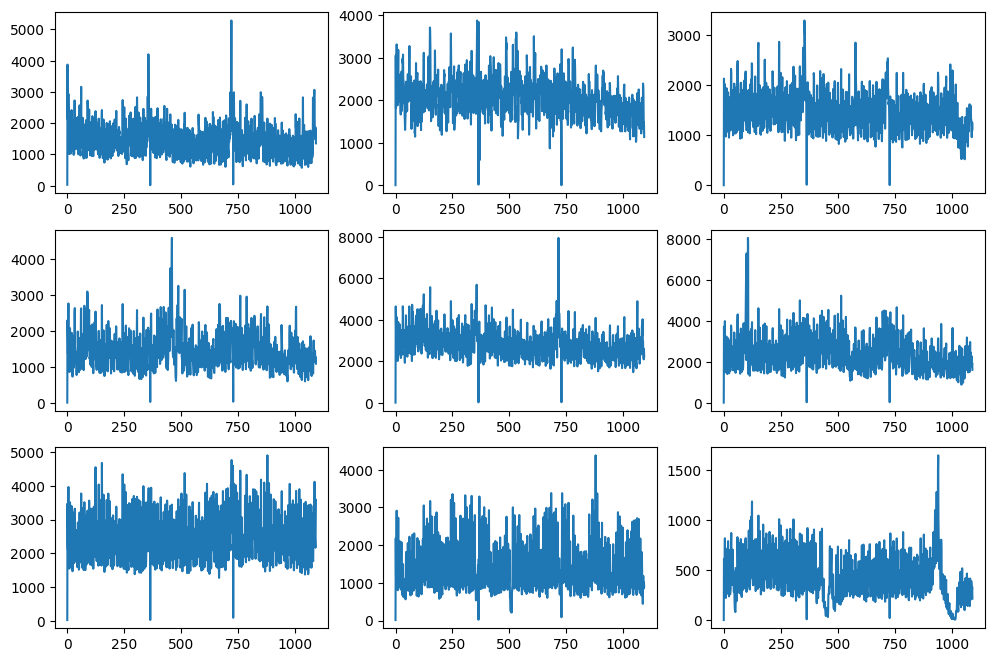

In [ ]:
fig,axes = plt.subplots(nrows = 3, ncols = 3, figsize=(12,8))
for i in range (1,4):
  for j in range (1,4):
    a = i-1
    b = (i-1) * 3+j
    axes[a,j-1].plot(demande.index, demande[demande.columns[b]])


In [ ]:
fichier = "/content/drive/MyDrive/OCD/Projet OCD/summary.csv"
summary = pd.read_csv(fichier, delimiter='\t')
summary

,Unnamed: 0,Product,Purchased_Cost,Lead_Time,Size,Selling_Price,Starting_Stock,Ordering_Cost,Holding_Cost,Demand_lead
0,0,159156,6,6,1.360,10.0,23147,20,5,8643.453977
1,1,584028,6,3,0.089,8.0,589,20,5,6146.767901
2,2,220435,7,6,0.052,8.6,22500,20,5,8441.831502
3,3,273528,17,12,0.042,25.0,1700,20,5,16580.924908
4,4,364606,2,15,0.780,4.0,600,20,5,41354.107143
5,5,559870,37,22,1.050,43.0,1400,20,5,50346.012821
6,6,502331,20,12,0.555,25.0,561,20,5,27439.519231
7,7,315176,6,16,0.530,10.2,5200,20,5,20853.167582
8,8,802833,12,9,0.570,16.1,2750,20,5,3608.505495


In [ ]:
class Product:
  def __init__ (self, i,a,b,c,d,e,f,g,h,mean,std):
    self.i = str(int(i))
    self.unit_cost = a
    self.lead_time = b
    self.size = c
    self.selling_price = d
    self.starting_stock = e
    self.ordering_cost = f
    self.holding_cost = g
    self.demand_lead = h
    self.mean = mean
    self.std = std

  def get_mean(self):
    return self.mean
  def get_std(self):
    return self.std
  def get_starting_stock(self):
    return self.starting_stock
  def get_demand_lead(self):
    return self.demand_lead
  def get_lead_time(self):
    return self.lead_time
  def get_selling_price(self):
    return self.selling_price
  def get_ordering_cost(self):
    return self.ordering_cost
  def get_holding_cost(self):
    return self.holding_cost
  def get_unit_cost(self):
    return self.unit_cost
  def get_size(self):
    return self.size
  def get_id(self):
    return self.i

In [ ]:
float(summary[summary['Product'] == int(demande.columns[1])]['Purchased_Cost'])

6.0

In [ ]:
product_obj = []
for i in range(1,10):
  nom_colonne = demande.columns #on crée une liste avec tt les noms des colonnes = nom produit, du dataframes demande
  mean = np.mean([np.log(j) for j in demande[nom_colonne[i]]])#moyenne des log de la demande sur les 3 ans
  std = np.std([np.log(j) for j in demande[nom_colonne[i]]])#standard deviation sur les 3 ans pour 1 produit
  product_obj.append(Product(float(summary[summary['Product']==int(demande.columns[i])]['Product']),float(summary[summary['Product']==int(demande.columns[i])]['Purchased_Cost']),float(summary[summary['Product']==int(demande.columns[i])]['Lead_Time']),float(summary[summary['Product']==int(demande.columns[i])]['Size']),float(summary[summary['Product']==int(demande.columns[i])]['Selling_Price']),float(summary[summary['Product']==int(demande.columns[i])]['Starting_Stock']),float(summary[summary['Product']==int(demande.columns[i])]['Ordering_Cost']),float(summary[summary['Product']==int(demande.columns[i])]['Holding_Cost']),float(summary[summary['Product']==int(demande.columns[i])]['Demand_lead']),mean,std))
  #print(mean,std)

Partie 1.4

In [ ]:
def demande_journaliere (produit):
  return np.exp(np.random.normal(produit.get_mean(), produit.get_std()))

In [ ]:
def monte_carlo_sim(produit,M,review_period):
  data = {'inv_level': [], 'daily_demand': [], 'units_sold': [],'units_lost': [], 'orders': []}
  compteur = 0 # nombre de commandes sur l'année
  inventory = produit.get_starting_stock()
  order_delivery_day = 0
  for i in range (1,366): #avec i un jour

    demande = demande_journaliere(produit)
    data['daily_demand'].append(demande)

    if  i% review_period == 0:
        order_quantity = max(0, M + produit.get_demand_lead() - inventory)
        order_delivery_day = i + produit.get_lead_time()
        data['orders'].append(order_quantity)
        compteur+=1
    else:
        data['orders'].append(0)

    if i == order_delivery_day:
        inventory += order_quantity

    units_sold = min(inventory, demande)
    units_lost = max(0, demande - inventory)

    inventory -= units_sold

    data['inv_level'].append(inventory)
    data['units_sold'].append(units_sold)
    data['units_lost'].append(units_lost)

  return data,compteur  # Compteur = le nombre de fois où on a commandé sur l'année

In [ ]:
def calculate_profit(produit,M,review_period):
  data,compteur = monte_carlo_sim(produit,M,review_period)
  benefice = sum(data['units_sold']) * produit.get_selling_price()
  #print(benefice)
  product_costs = sum(data['orders']) * produit.get_unit_cost()
  #print(product_costs)
  ordering_costs = compteur * produit.get_ordering_cost()
  #print(ordering_costs)
  holding_costs = sum(data['inv_level'])  * produit.get_size() * (produit.get_holding_cost()/365) #car holding cost pour l'année, nous on veut journalier
  #print(holding_costs)
  profit = benefice - (product_costs + ordering_costs + holding_costs)
  return profit,data

In [ ]:
#Fonction qui fait tourner monte_carlo_sim  num_simulations fois

In [ ]:
def mc_simulation(num_simulations, M, produit, review_period):
  list_profit = []
  list_loss = []
  for i in range(num_simulations):
    profit, data = calculate_profit(produit,M,review_period)
    list_profit.append(profit)
    loss = sum(data['units_lost']) / (sum(data['daily_demand']))  # Unites perdues divisé par la demande annuelle
    list_loss.append(loss)
  return list_profit, list_loss






In [ ]:
M = 70000
review_period = 30
produit = product_obj[0]
num_simulations = 10
mc_simulation(num_simulations, M, produit, review_period)
#profit,data = calculate_profit(product_obj[1],M,review_period)


([1407472.58615292,
  1364685.0951323984,
  1394178.3200224643,
  1467806.9613605095,
  1407503.1519959406,
  1442780.294748135,
  1546287.4740859373,
  1452715.2107051904,
  1365573.2446003682,
  1477338.315002338],
 [0.05941282186059027,
  0.057276616480170885,
  0.06484696177709023,
  0.056202266622189086,
  0.039450563463669826,
  0.05460073829876662,
  0.04658228059375942,
  0.04842432247318366,
  0.062465145580246885,
  0.06476712045136648])

partie 1.5

In [ ]:
def periodic_review(product, low, high,review_period, step=500, nbsim=100):
  m_range = [i for i in range(low, high, step)]
  review_dict = {}
  for M in m_range:
    p_list, o_list = mc_simulation(nbsim,M,product,review_period)
    review_dict[M] = (np.mean(p_list), np.mean(o_list))
  return review_dict

In [ ]:
low = 30000
high = 80000
product = product_obj[0]
review_period = 30
review_dict = periodic_review(product, low, high,review_period)
#print(review_dict)

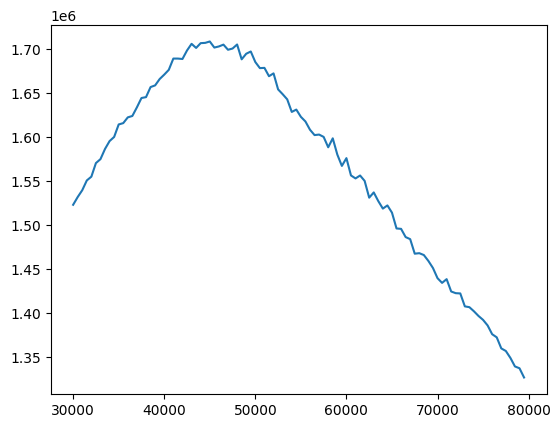

In [ ]:
import matplotlib.pyplot as plt
x = [i for i in review_dict.keys()]
y = []
for val in review_dict.values():
  y.append(val[0])
plt.plot(x, y)
plt.show()

In [ ]:
#import operator
#max(review_dict.items(), key=operator.itemgetter(1))

In [ ]:
import operator
M_optimal = []
low = 30000
high = 80000
review_period = 30
#for i in range(len(product_obj)):
#  product = product_obj[i]
#  review_dict = periodic_review(product, low, high,review_period)
#  M_optimal.append(max(review_dict.items(), key=operator.itemgetter(1))[0])
#M_optimal

In [ ]:
#copie des M optimum pour éviter de relancer à chaque fois

M_optimal = [46500, 68000, 43000, 44000, 78500, 32000, 61000, 40500, 30000]

partie 1.6

In [ ]:
fichier3 = "/content/drive/MyDrive/OCD/Projet OCD/test_day_product.csv"
vente = pd.read_csv(fichier3, delimiter='\t') #données de ventes pour la 4ème année
vente

,Unnamed: 0,159156,584028,220435,273528,364606,559870,502331,315176,802833
0,0,34.592,8.328,16.0,14.0,32.0,26.0,99.0,29.0,13.0
1,1,1775.243,2365.026,1248.0,1771.0,2986.0,2748.0,2901.0,1599.0,497.0
2,2,3336.769,2505.258,1478.0,2050.0,3074.0,3359.0,3881.0,2965.0,591.0
3,3,2581.899,2185.612,1263.0,1402.0,2751.0,2582.0,2498.0,2025.0,302.0
4,4,1706.258,1880.647,960.0,1233.0,2455.0,2038.0,2319.0,1578.0,265.0
...,...,...,...,...,...,...,...,...,...,...
360,360,1399.170,1859.370,607.0,1006.0,2315.0,1642.0,2021.0,817.0,172.0
361,361,1155.678,1954.154,918.0,1158.0,2269.0,1646.0,2144.0,721.0,207.0
362,362,1059.504,1466.672,1125.0,1169.0,2253.0,1836.0,2140.0,822.0,187.0
363,363,2359.574,2186.533,1432.0,1344.0,2893.0,2034.0,3163.0,885.0,240.0


In [ ]:
liste_moy_vente_test =[]
liste_moy_vente_train =[]
comparaison = []
for i in range (1,10) :
  liste_moy_vente_test.append(vente[nom_colonne[i]].mean()) #nom_colonne c'est la liste des identifiants des produits (voir début du code)
  liste_moy_vente_train.append(demande[nom_colonne[i]].mean())
  comparaison.append((vente[nom_colonne[i]].mean()-demande[nom_colonne[i]].mean()))
comparaison

[-455.2581351046215,
 -359.09103938481644,
 -374.8721837523208,
 -420.3371167645139,
 -286.6955517085653,
 -320.3780621205276,
 -294.63792714135184,
 -350.7011214812584,
 -183.8131466706809]

Demande en 2016 qui varie par rapport aux données des 3 années précédentes, distribution log-normale qui ne prend pas en compte les tendances d'évolution des données de train et n'arrive pas à prédire correctement la demande de l'année 2016

Train est toujours plus gros d'environ 300+ou- 150

In [ ]:
def monte_carlo_sim2(produit,M,review_period):
  data = {'inv_level': [], 'daily_demand': [], 'units_sold': [],'units_lost': [], 'orders': []}
  compteur = 0 # nombre de commandes sur l'année
  inventory = produit.get_starting_stock()
  order_delivery_day = 0
  for i in range (1,366): #avec i un jour

    #LES SEULES 2 LIGNES MODIFIEES POUR CETTE VERSION 2 DE monte_carlo_sim
    demande = vente[produit.get_id()][i-1] # real demand values of the test day product.csv file
    data['daily_demand'].append(demande)

    if  i% review_period == 0:
        order_quantity = max(0, M + produit.get_demand_lead() - inventory)
        order_delivery_day = i + produit.get_lead_time()
        data['orders'].append(order_quantity)
        compteur+=1
    else:
        data['orders'].append(0)

    if i == order_delivery_day:
        inventory += order_quantity

    units_sold = min(inventory, demande)
    units_lost = max(0, demande - inventory)

    inventory -= units_sold

    data['inv_level'].append(inventory)
    data['units_sold'].append(units_sold)
    data['units_lost'].append(units_lost)

  return data,compteur  # Compteur = le nombre de fois où on a commandé sur l'année

def calculate_profit2(produit,M,review_period):
  data,compteur = monte_carlo_sim2(produit,M,review_period)
  benefice = sum(data['units_sold']) * produit.get_selling_price()
  product_costs = sum(data['orders']) * produit.get_unit_cost()
  ordering_costs = compteur * produit.get_ordering_cost()
  holding_costs = sum(data['inv_level'])  * produit.get_size() * (produit.get_holding_cost()/365) #car holding cost pour l'année, nous on veut journalier
  profit = benefice - (product_costs + ordering_costs + holding_costs)
  return profit,data


def mc_simulation2(num_simulations, M, produit, review_period):
  list_profit = []
  list_loss = []
  for i in range(num_simulations):
    profit, data = calculate_profit2(produit,M,review_period)
    list_profit.append(profit)
    loss = sum(data['units_lost']) / (sum(data['daily_demand']))
    list_loss.append(loss)
  return list_profit, list_loss

def periodic_review2(product, low, high,review_period, step=500, nbsim=100):
  m_range = [i for i in range(low, high, step)]
  review_dict = {}
  for M in m_range:
    p_list, o_list = mc_simulation2(nbsim,M,product,review_period)
    review_dict[M] = (np.mean(p_list), np.mean(o_list))
  return review_dict


In [ ]:
import operator
M_optimal2 = []
low = 30000
high = 80000
review_period = 30
#for i in range(len(product_obj)):
#  product = product_obj[i]
#  review_dict = periodic_review2(product, low, high,review_period)
#  M_optimal2.append(max(review_dict.items(), key=operator.itemgetter(1))[0])
#M_optimal2

In [ ]:
#resultat copié pour ne pas refaire tourner à chaque fois (3minutes)
M_optimal2 = [31500, 47500, 38000, 30000, 73500, 30000, 53000, 30000, 30000]

#on veut calculer profit avec chaque M optimal
liste_profits_optimal_test = []
for i in range (9):
  liste_profits_optimal_test.append(calculate_profit2(product_obj[i],M_optimal2[i],review_period)[0])# [0] pour recupérer que profit et pas data
liste_profits_optimal_test

[1125835.065271872,
 827470.9005009802,
 430967.943829997,
 1781259.6535660103,
 1256939.4344618404,
 417506.291921325,
 1790886.006990252,
 951003.816541472,
 -130999.51797681698]

Attention un profit peut être négatif, c'est la plus petite perte que l'on pouvait avoir pour le produit 9

In [ ]:
#idem avec les M optimal pour train, donc avec la liste : M_optimal
liste_profits_optimal_train = []
for i in range (9):
  liste_profits_optimal_train.append(calculate_profit2(product_obj[i],M_optimal[i],review_period)[0])
liste_profits_optimal_train


[1009301.2605586285,
 714828.7099246993,
 403763.4101953935,
 1587080.8002259023,
 1251189.9533561657,
 391643.7703196369,
 1699820.4384602215,
 885747.6881770287,
 -130999.51797681698]

Pour les trains , le profit du produit 9 est aussi négatif et sinon les valeurs sont plus petites que pour les tests

partie 1.6, question 5

In [ ]:
def erreur_au_carre (num_produit):
  demande_reel = vente[nom_colonne[num_produit]].to_numpy() #transforme une colonne du df en tableau
  demande_genere = []
  abscisse = []
  for i in range(0,365):
    demande_genere.append(demande_journaliere(product_obj[num_produit]))
    abscisse.append(i+1)

  return mean_squared_error(demande_reel, demande_genere)
  plt.plot( abscisse,demande_reel, color='red')
  plt.plot( abscisse, demande_genere, color='blue')
  plt.show()



In [ ]:
erreur_au_carre(1)

2169758.5188423125

FIN ETAPE 1 : Voici les M optimaux pour optimiser les profits [31500, 47500, 38000, 30000, 73500, 30000, 53000, 30000, 30000]

STEP 2

In [ ]:
!pip install pmdarima
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 12.4 MB/s eta 0:00:00


In [ ]:
#demande => c'est les ventes réalisées entre 2013 et 2015, qui nous serviront des données de train (fichier train_day_product.csv)
for i in range (0,9):
  result = adfuller(demande[nom_colonne[i]])
  if not (result[1]<0.05):
    print("Le produit",i+1,"n'a pas une demande stationnaire")

#print('ADF Statistic:', result[0])
#print('p-value:', result[1])
#print('Critical Values:', result[4])
#f the p-value is less than a significance level (e.g., 0.05), you can reject the null hypothesis and conclude that the time
#series is stationary. If the p-value is high, you may need to apply differencing or other techniques to make the series stationary.

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:957: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


In [ ]:
nom_colonne

Index(['Unnamed: 0', '159156', '584028', '220435', '273528', '364606',
       '559870', '502331', '315176', '802833'],
      dtype='object')

Tout nos produits ont une demande stationnaire !

partie 2 (step 2)

In [ ]:
demande_step2 = pd.DataFrame({})
for i in range(1,10):
  model = auto_arima(demande[nom_colonne[i]],seasonal=False,stationary=True)

  forecasts = model.predict(365) #pour 1 ans

  product_forecast_df = pd.DataFrame({nom_colonne[i]:forecasts})
  demande_step2 = pd.concat([demande_step2, product_forecast_df], axis=1)

demande_step2

,159156,584028,220435,273528,364606,559870,502331,315176,802833
1092,1519.948718,1583.037798,1139.992922,1164.949934,2629.533174,1579.105891,2465.616655,938.972837,220.360554
1093,1390.189404,1860.759693,1266.330975,1320.909736,2734.475797,1820.481574,2103.504649,1042.271440,379.951346
1094,1166.707132,2087.778353,1447.330546,1372.283649,2729.061013,2516.935316,2615.544012,1002.246238,427.629489
1095,1421.347920,2176.008405,1433.839806,1381.710218,2734.426742,2638.696388,2856.358473,980.896027,326.480902
1096,1300.480398,2150.890157,1318.811553,1382.143608,2838.685884,2207.495829,2233.759714,978.024574,285.380983
...,...,...,...,...,...,...,...,...,...
1452,1464.192894,2037.719631,1444.097142,1381.562379,2763.656274,2479.207445,2452.792567,975.951621,405.624907
1453,1387.042315,2037.719631,1382.739738,1381.562379,2763.656274,2255.603268,2226.390583,975.951316,405.624907
1454,1544.690661,2037.719631,1352.163890,1381.562379,2763.656274,2108.949260,2091.046684,975.951011,405.624907
1455,1340.157332,2037.719631,1350.095747,1381.562379,2763.656274,2084.580306,2107.726619,975.950707,405.624907


In [ ]:
def trace(num_produit):

    # Get the actual demand for the current product
    actual_demand_product = vente[nom_colonne[num_produit]]

    # Get the generated demand forecast for the current product
    generated_demand = demande_step2[nom_colonne[num_produit]]


    # Plot the actual and generated demand time series
    plt.figure(figsize=(10, 5))
    plt.plot(actual_demand_product, label='Actual Demand', marker='o')
    plt.plot(generated_demand, label='Generated Demand', marker='o')

    plt.xlabel('Time')
    plt.ylabel('Demand')
    plt.legend()
    plt.show()



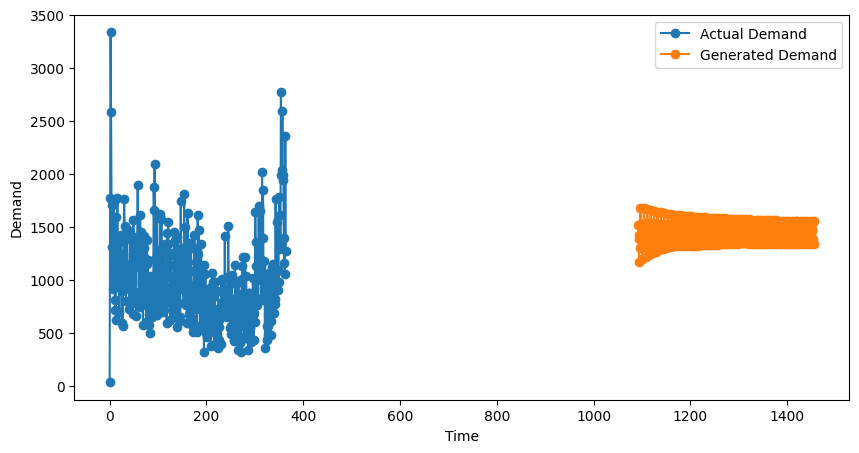

In [ ]:
trace(1)

Le plot est juste décalé (la demande générée commence a 1092 et ne se superpose pas). Sinon la demande généré ressemble à la demande du fichier train, mais il y'a juste moins d'écart entre les variables, mais la moyenne est similaire

In [ ]:
def mse(num_produit):
  actual_demand_product = vente[nom_colonne[num_produit]]
  generated_demand = demande_step2[nom_colonne[num_produit]]
  ecart = mean_squared_error(actual_demand_product, generated_demand)
  return ecart


In [ ]:
ecart = mse(1)
np.sqrt(ecart)

635.0067837103508

In [ ]:
def monte_carlo_sim3(produit,M,review_period):
  data = {'inv_level': [], 'daily_demand': [], 'units_sold': [],'units_lost': [], 'orders': []}
  compteur = 0 # nombre de commandes sur l'année
  inventory = produit.get_starting_stock()
  order_delivery_day = 0
  for i in range (1,366): #avec i un jour

    #LES SEULES 2 LIGNES MODIFIEES POUR CETTE VERSION 3 DE la methode ARIMA
    valeurs_demande = demande_step2[produit.get_id()].values
    demande = valeurs_demande[i-1] # Demande génerée par la méthode ARIMA
    data['daily_demand'].append(demande)

    if  i% review_period == 0:
        order_quantity = max(0, M + produit.get_demand_lead() - inventory)
        order_delivery_day = i + produit.get_lead_time()
        data['orders'].append(order_quantity)
        compteur+=1
    else:
        data['orders'].append(0)

    if i == order_delivery_day:
        inventory += order_quantity

    units_sold = min(inventory, demande)
    units_lost = max(0, demande - inventory)

    inventory -= units_sold

    data['inv_level'].append(inventory)
    data['units_sold'].append(units_sold)
    data['units_lost'].append(units_lost)

  return data,compteur  # Compteur = le nombre de fois où on a commandé sur l'année

def calculate_profit3(produit,M,review_period):
  data,compteur = monte_carlo_sim3(produit,M,review_period)
  benefice = sum(data['units_sold']) * produit.get_selling_price()
  product_costs = sum(data['orders']) * produit.get_unit_cost()
  ordering_costs = compteur * produit.get_ordering_cost()
  holding_costs = sum(data['inv_level'])  * produit.get_size() * (produit.get_holding_cost()/365) #car holding cost pour l'année, nous on veut journalier
  profit = benefice - (product_costs + ordering_costs + holding_costs)
  return profit,data


def mc_simulation3(num_simulations, M, produit, review_period):
  list_profit = []
  list_loss = []
  for i in range(num_simulations):
    profit, data = calculate_profit3(produit,M,review_period)
    list_profit.append(profit)
    loss = sum(data['units_lost']) / (sum(data['daily_demand']))
    list_loss.append(loss)
  return list_profit, list_loss

def periodic_review3(product, low, high,review_period, step=500, nbsim=100):
  m_range = [i for i in range(low, high, step)]
  review_dict = {}
  for M in m_range:
    p_list, o_list = mc_simulation3(nbsim,M,product,review_period)
    review_dict[M] = (np.mean(p_list), np.mean(o_list))
  return review_dict


In [ ]:
import operator
M_optimal = []
low = 30000
high = 80000
review_period = 30
for i in range(len(product_obj)):
  product = product_obj[i]
  review_dict = periodic_review(product, low, high,review_period)
  M_optimal.append(max(review_dict.items(), key=operator.itemgetter(1))[0])

M_optimal

[46000, 64000, 44000, 43500, 79500, 30000, 62500, 43000, 30000]

In [ ]:
M_optimal_step_2 = [44000, 64500, 43000, 46000, 79000, 30500, 63500, 42000, 30000] # pour ne pas resimuler

In [ ]:
liste_profits_optimal_step2 = []
for i in range (9):
  liste_profits_optimal_step2.append(calculate_profit3(product_obj[i],M_optimal_step_2[i],review_period)[0])
liste_profits_optimal_step2

[1740711.9548801216,
 997369.5321328444,
 630685.6628431929,
 2695386.167747576,
 1382687.3185390218,
 654123.8639567755,
 1968138.8603778724,
 943767.7736834912,
 152258.3134386416]

 Anciens profits : [1009301.2605586285,
 714828.7099246993,
 403763.4101953935,
 1587080.8002259023,
 1251189.9533561657,
 391643.7703196369,
 1699820.4384602215,
 885747.6881770287,
 -130999.51797681698]

resultats obtenus :
[5644496.100308217,
 4012320.060189193,
 2319893.2679496408,
 10919449.457707271,
 5035138.859620059,
 8270334.609139189,
 10015711.130738057,
 3801606.0761102233,
 1260492.0579379965]
 Il n'ya pas de profit négatif par rapport a ceux de la première méthode, on peut donc dire que la méthode 2 est plus optimisée, la demande est mieux générée.

STEP 3

partie 1,2,3

In [ ]:
def generate_examples(sequence_data,produit, n_steps_in, n_steps_out):
  valeurs_x = []
  valeurs_y = []
  valeurs = []
  for j in range (0 , sequence_data.shape[0]-(n_steps_in + n_steps_out)):
    x = []
    y = []
    a = n_steps_in + n_steps_out + j
    for i in range(j,a):
      if i < n_steps_in + j :
        x.append(sequence_data[produit][i])
      else:
        y.append(sequence_data[produit][i])
    valeurs_x.append(x)
    valeurs_y.append(y)
  valeurs.append(valeurs_x)
  valeurs.append(valeurs_y)


  return valeurs

In [ ]:
#demande c'est le fichier train importé précédemment
n_steps_in = 28
n_steps_out = 30
sequence_data = demande #demande c'est le fichier train importé précédemment, sous forme de data frames
couples_valeurs_par_produit_train = []
for i in range (0,9):
  produit = product_obj[i].get_id()
  tab = generate_examples(sequence_data,produit ,n_steps_in, n_steps_out)
  couples_valeurs_par_produit_train.append(tab)

In [ ]:
couples_valeurs_par_produit_train

[[[[29.904,
    3875.964,
    2128.5200000000004,
    2801.060000000001,
    2290.1200000000003,
    2936.031,
    1688.917,
    1285.362,
    1307.1080000000002,
    1012.7,
    1750.5230000000004,
    1663.8280000000002,
    2383.384,
    1305.595,
    1252.781,
    1524.771,
    1030.0800000000002,
    1902.115,
    1817.199,
    2418.064,
    1531.6259999999995,
    1106.779,
    1501.4349999999995,
    1137.197,
    2108.4820000000004,
    1851.981,
    1783.0890000000004,
    1324.962],
   [3875.964,
    2128.5200000000004,
    2801.060000000001,
    2290.1200000000003,
    2936.031,
    1688.917,
    1285.362,
    1307.1080000000002,
    1012.7,
    1750.5230000000004,
    1663.8280000000002,
    2383.384,
    1305.595,
    1252.781,
    1524.771,
    1030.0800000000002,
    1902.115,
    1817.199,
    2418.064,
    1531.6259999999995,
    1106.779,
    1501.4349999999995,
    1137.197,
    2108.4820000000004,
    1851.981,
    1783.0890000000004,
    1324.962,
    987.573],
   

In [ ]:
#vente c'est le fichier train importé précédemment
n_steps_in = 28
n_steps_out = 30
sequence_data = vente #vente c'est le fichier train importé précédemment, sous forme de data frames
couples_valeurs_par_produit_test = []
for i in range (0,9):
  produit = product_obj[0].get_id()
  tab = generate_examples(sequence_data,produit ,n_steps_in, n_steps_out)
  couples_valeurs_par_produit_test.append(tab)

partie 4

In [ ]:
n_features = 1
# define model
model = Sequential()
model.add(LSTM(100, activation='relu', return_sequences=True,
input_shape=(n_steps_in, n_features)))
model.add(LSTM(100, activation='relu'))
model.add(Dense(n_steps_out))
model.compile(optimizer='adam', loss='mse')


In [ ]:
n_features = 1
def model_neurone(num_produit):

  liste_X = couples_valeurs_par_produit_train[num_produit][0]
  y = np.array(couples_valeurs_par_produit_train[num_produit][1])
  X = np.array(liste_X)
  print(X.shape)
  X = X.reshape((X.shape[0], X.shape[1], n_features))
  # fit model
  model.fit(X, y, epochs=75, verbose=1)

  x_input = np.array(couples_valeurs_par_produit_test[num_produit][0])
  x_input = x_input.reshape((x_input.shape[0], x_input.shape[1], n_features))
  yhat = model.predict(x_input, verbose=0)

  return yhat


Méthode du step 3 pour le premier produit. Nous avons commencé pour un produit puis nous avons généralisé au 9 autres produits après.

In [ ]:
#pour le produit 0
y_predit_methode_3 = model_neurone(0)
y_predit_methode_3


(1034, 28)
Epoch 1/75
33/33 [==============================] - 4s 38ms/step - loss: 2160368.2500
Epoch 2/75
33/33 [==============================] - 1s 39ms/step - loss: 1362199.2500
Epoch 3/75
33/33 [==============================] - 1s 38ms/step - loss: 990961.0000
Epoch 4/75
33/33 [==============================] - 2s 53ms/step - loss: 1018321.4375
Epoch 5/75
33/33 [==============================] - 2s 62ms/step - loss: 1035287.3125
Epoch 6/75
33/33 [==============================] - 1s 41ms/step - loss: 703681.4375
Epoch 7/75
33/33 [==============================] - 1s 38ms/step - loss: 683146.3125
Epoch 8/75
33/33 [==============================] - 1s 38ms/step - loss: 1266790.2500
Epoch 9/75
33/33 [==============================] - 1s 40ms/step - loss: 716974.6875
Epoch 10/75
33/33 [==============================] - 1s 39ms/step - loss: 725309.0000
Epoch 11/75
33/33 [==============================] - 1s 38ms/step - loss: 739895.7500
Epoch 12/75
33/33 [============================

array([[1225.5112 , 1273.4504 , 1324.4287 , ..., 1206.5814 , 1326.781  ,
        1337.3691 ],
       [1352.0636 , 1450.746  , 1475.0758 , ..., 1268.7698 , 1477.0635 ,
        1517.2527 ],
       [1602.8983 , 1659.5812 , 1341.2722 , ..., 1452.0908 , 1706.1747 ,
        1737.7698 ],
       ...,
       [1050.8221 ,  958.6425 ,  999.1793 , ..., 1161.9697 , 1058.8763 ,
         988.88165],
       [1032.5636 , 1077.7238 , 1134.8994 , ..., 1033.6765 , 1107.5353 ,
        1123.9462 ],
       [ 962.289  ,  973.856  , 1026.2003 , ...,  978.75446, 1002.1978 ,
        1009.443  ]], dtype=float32)

In [ ]:
y_predit_methode_3.shape

(307, 30)

In [ ]:
y_predit_methode_3

array([[1225.5112 , 1273.4504 , 1324.4287 , ..., 1206.5814 , 1326.781  ,
        1337.3691 ],
       [1352.0636 , 1450.746  , 1475.0758 , ..., 1268.7698 , 1477.0635 ,
        1517.2527 ],
       [1602.8983 , 1659.5812 , 1341.2722 , ..., 1452.0908 , 1706.1747 ,
        1737.7698 ],
       ...,
       [1050.8221 ,  958.6425 ,  999.1793 , ..., 1161.9697 , 1058.8763 ,
         988.88165],
       [1032.5636 , 1077.7238 , 1134.8994 , ..., 1033.6765 , 1107.5353 ,
        1123.9462 ],
       [ 962.289  ,  973.856  , 1026.2003 , ...,  978.75446, 1002.1978 ,
        1009.443  ]], dtype=float32)

la shape c'est (307,30), c'est normal car (voir photo 15-01), chaque jour est predit plusieurs fois : le 1 est predit 1 fois, le 2 eme 2 fois, puis à partir du 30eme ils sont predit 30 fois, sauf pour les 30 derniers. L'avant dernier est predit 2 fois et le dernier 1 fois. Mtn il faut faire la moyenne

In [ ]:
def trouve_moyenne_demande (y_predit):
  moy_y_predit = []
  for i in range (0,29):
      somme = 0
      for j in range (0,i+1):
        somme += y_predit[j][i-j]
      moy_y_predit.append( somme/(i+1))
  for i in range (0,307):
      somme = 0
      for j in range (0,29):
        somme += y_predit[i][29-j]
      moy_y_predit.append(somme/30)
  for i in range (278,307):
      somme = 0
      for j in range (0,307-i):
        somme += y_predit[i+j][29-j]
      moy_y_predit.append( somme/(307-i))
  return moy_y_predit

In [ ]:
y_predit_methode_3[306][29]

1009.443

In [ ]:
liste = trouve_moyenne_demande(y_predit_methode_3)

In [ ]:
a=len(liste)
a

365

In [ ]:
liste

[1225.51123046875,
 1312.7570190429688,
 1459.357666015625,
 1465.5740051269531,
 1318.55390625,
 1170.9866638183594,
 1094.5829467773438,
 1152.061149597168,
 1311.7995198567708,
 1386.8220703125,
 1326.2691372958097,
 1192.8675537109375,
 1100.083233173077,
 1082.136962890625,
 1173.504951985677,
 1283.3152313232422,
 1324.1468434053309,
 1254.4642198350693,
 1138.5339837325246,
 1070.5878631591797,
 1068.2090890066963,
 1163.3008894486861,
 1262.8627584706182,
 1297.1132354736328,
 1216.2876708984375,
 1100.105485182542,
 1037.4645589192708,
 1051.030986240932,
 1164.1707132273707,
 1273.0859375,
 1362.022021484375,
 1341.7627726236979,
 1139.318935139974,
 1203.434901936849,
 1186.0252583821614,
 1115.9857421875,
 1137.9882100423176,
 1184.7827372233073,
 1085.8836222330729,
 1060.415877278646,
 1079.5855977376302,
 1118.3589172363281,
 1055.966914876302,
 1114.8861938476562,
 1098.3887471516928,
 1124.0525655110678,
 998.2938802083333,
 1139.3099548339844,
 1148.044169108073,
 108

In [ ]:
def mse_3(num_produit):
  ecart = mean_squared_error(vente[nom_colonne[num_produit]],trouve_moyenne_demande(y_predit_methode_3) )
  return ecart

In [ ]:
mse_3(0)
np.sqrt(ecart)

635.0067837103508

In [ ]:
def trace(num_produit):

    # Get the actual demand for the current product
    actual_demand_product = vente[nom_colonne[num_produit]]

    # Get the generated demand forecast for the current product
    generated_demand = liste#liste c'est déjà pour le produit 1 liste


    # Plot the actual and generated demand time series
    plt.figure(figsize=(10, 5))
    plt.plot(actual_demand_product, label='Actual Demand', marker='o')
    plt.plot(generated_demand, label='Generated Demand', marker='o')

    plt.xlabel('Time')
    plt.ylabel('Demand')
    plt.legend()
    plt.show()


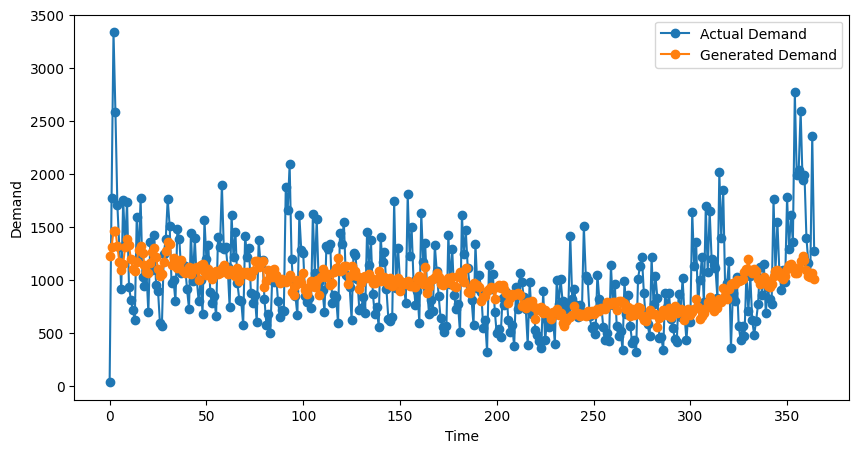

In [ ]:
trace(1)


D'après nos résultats pour le produit 1, l'écart type trouvé avec la métode 2 : 522 est meilleur que celui trouvé pour la méthode 2 : 622. Nos prévisions ont donc l'air de meilleur qualité. Visuelement, pour le produit 1 suit bien les données test. Nous pensons donc que nos profits seront meilleurs avec la méthode 3 que avec la méthode 2.

Methode du step 3 pour les 9 produits :

In [ ]:
#Métode 3 pour tout les produits :

stockage_prediction_m3 = []

for i in range (0,9):
  stockage_prediction_m3.append(trouve_moyenne_demande(model_neurone(i)))

(1034, 28)
Epoch 1/75
33/33 [==============================] - 1s 39ms/step - loss: 244866.9844
Epoch 2/75
33/33 [==============================] - 1s 39ms/step - loss: 243299.0625
Epoch 3/75
33/33 [==============================] - 1s 39ms/step - loss: 241236.3594
Epoch 4/75
33/33 [==============================] - 1s 38ms/step - loss: 235380.5312
Epoch 5/75
33/33 [==============================] - 2s 55ms/step - loss: 237579.9531
Epoch 6/75
33/33 [==============================] - 2s 62ms/step - loss: 233835.3438
Epoch 7/75
33/33 [==============================] - 1s 39ms/step - loss: 249590.8594
Epoch 8/75
33/33 [==============================] - 1s 38ms/step - loss: 369676.7188
Epoch 9/75
33/33 [==============================] - 1s 38ms/step - loss: 266083.6875
Epoch 10/75
33/33 [==============================] - 1s 38ms/step - loss: 235486.0469
Epoch 11/75
33/33 [==============================] - 1s 38ms/step - loss: 231368.1562
Epoch 12/75
33/33 [==============================] -

In [ ]:
stockage_prediction_m3


[[1146.880615234375,
  1796.4742431640625,
  2162.038289388021,
  1845.6843566894531,
  1476.36171875,
  1070.7398173014324,
  949.6317051478794,
  1194.7281112670898,
  1418.824245876736,
  1630.769384765625,
  1402.7944391424005,
  1124.8302561442058,
  970.1007455679087,
  921.8045261928013,
  1199.814314778646,
  1345.477798461914,
  1488.2855296415441,
  1287.5737202962239,
  1058.7522326017681,
  958.0847198486329,
  932.0054379417783,
  1200.385292746804,
  1312.193311608356,
  1431.5689137776692,
  1238.616435546875,
  1026.4535991962139,
  947.4352190936053,
  934.5110277448382,
  1186.2419559873383,
  1307.6185526529948,
  1403.0698608398438,
  1331.5184143066406,
  1232.4483581542968,
  1168.9037679036458,
  1188.6925659179688,
  1141.4677815755208,
  1097.4178039550782,
  1111.4747965494792,
  1102.4659627278645,
  1080.415625,
  1072.10751953125,
  1080.5471740722655,
  1123.595273844401,
  1060.2200480143229,
  1108.7078592936198,
  1057.7378377278646,
  1064.709767659505

In [ ]:
nom_colonne = ['159156', '584028', '220435', '273528', '364606','559870', '502331', '315176', '802833']

On copie colle le résultat de la liste obtenue afin de ne pas perdre le temps d'exécution du code.

In [ ]:
liste_demande_predite_LSTM = [[1146.880615234375,
  1796.4742431640625,
  2162.038289388021,
  1845.6843566894531,
  1476.36171875,
  1070.7398173014324,
  949.6317051478794,
  1194.7281112670898,
  1418.824245876736,
  1630.769384765625,
  1402.7944391424005,
  1124.8302561442058,
  970.1007455679087,
  921.8045261928013,
  1199.814314778646,
  1345.477798461914,
  1488.2855296415441,
  1287.5737202962239,
  1058.7522326017681,
  958.0847198486329,
  932.0054379417783,
  1200.385292746804,
  1312.193311608356,
  1431.5689137776692,
  1238.616435546875,
  1026.4535991962139,
  947.4352190936053,
  934.5110277448382,
  1186.2419559873383,
  1307.6185526529948,
  1403.0698608398438,
  1331.5184143066406,
  1232.4483581542968,
  1168.9037679036458,
  1188.6925659179688,
  1141.4677815755208,
  1097.4178039550782,
  1111.4747965494792,
  1102.4659627278645,
  1080.415625,
  1072.10751953125,
  1080.5471740722655,
  1123.595273844401,
  1060.2200480143229,
  1108.7078592936198,
  1057.7378377278646,
  1064.7097676595051,
  1068.0866475423177,
  1044.4795227050781,
  1045.5525553385417,
  1026.3642578125,
  1073.5181498209636,
  1041.3108011881511,
  1085.2104410807292,
  1068.0236673990885,
  1050.425850423177,
  1075.7747538248698,
  1079.126035563151,
  1111.354453531901,
  1078.925966389974,
  1080.6954040527344,
  1088.7299906412761,
  1112.513144938151,
  1110.733066813151,
  1054.8734232584636,
  1111.6858561197917,
  1114.7912089029949,
  1123.4562967936197,
  1063.9094401041666,
  1035.271866861979,
  1055.4032470703125,
  1018.072422281901,
  1028.9149190266928,
  1070.1308288574219,
  1064.029402669271,
  1036.8394063313801,
  1041.0056315104166,
  1044.7446797688801,
  977.659482828776,
  1005.6201334635417,
  1044.9687235514323,
  1050.564090983073,
  1016.7369506835937,
  962.1952331542968,
  1043.0399393717448,
  1012.9927022298177,
  1016.305898030599,
  983.8237162272136,
  960.4852091471354,
  932.7163106282552,
  927.2626098632812,
  953.1645589192708,
  889.2014607747395,
  951.8719380696615,
  947.1819600423177,
  1009.1349914550781,
  998.9856608072917,
  991.2565002441406,
  992.6679524739583,
  948.0157002766927,
  1004.1168477376302,
  1022.6351888020833,
  1014.4662699381511,
  986.0284281412761,
  971.2262715657552,
  984.3813537597656,
  990.1088887532552,
  1026.250370279948,
  961.6496114095052,
  963.9008239746094,
  940.2023783365886,
  928.0180745442708,
  944.2560974121094,
  979.6654174804687,
  1056.3307637532553,
  1116.4356892903645,
  1148.1198669433593,
  1088.490781656901,
  1083.5875305175782,
  1136.2952311197917,
  1067.4184244791666,
  1133.140254720052,
  1040.503603108724,
  1060.0440165201824,
  1055.8625061035157,
  1060.617205810547,
  1087.719415283203,
  995.3436197916667,
  979.4155782063802,
  1009.3468607584635,
  990.7983052571615,
  975.618477376302,
  971.0360758463542,
  1024.0142110188801,
  964.0044860839844,
  1020.5436991373698,
  997.4549825032552,
  1017.0016337076823,
  1002.6961466471354,
  959.581298828125,
  940.8636372884115,
  926.9102742513021,
  961.3026387532552,
  968.8036051432292,
  1010.1551208496094,
  995.8359212239583,
  940.7498514811198,
  956.1425577799479,
  962.3800923665365,
  1016.4407979329427,
  944.6690348307292,
  984.3708618164062,
  962.4580362955729,
  954.2484334309896,
  973.8193196614583,
  925.6467508951823,
  940.6215026855468,
  967.6665588378906,
  1017.6934509277344,
  1007.9776489257813,
  987.7469787597656,
  1017.8691853841145,
  965.7035725911459,
  1022.5683430989583,
  1009.1974568684896,
  1015.7636474609375,
  986.3683837890625,
  960.1813639322917,
  973.6639709472656,
  948.2619222005209,
  1025.6864237467448,
  994.5721598307292,
  940.8311197916667,
  918.5230814615885,
  893.1052693684895,
  913.6255452473958,
  859.4298217773437,
  954.5915181477865,
  960.821474202474,
  980.9413940429688,
  1002.162666829427,
  977.821376546224,
  1006.8429219563802,
  900.505419921875,
  944.939034016927,
  957.2098002115886,
  989.2409444173177,
  983.9488301595052,
  1000.7536641438802,
  979.6071716308594,
  919.8290771484375,
  945.8537068684896,
  926.9646118164062,
  929.6137064615885,
  893.2888610839843,
  872.4760559082031,
  855.5490600585938,
  768.7702209472657,
  823.5335001627604,
  841.1168212890625,
  874.6926493326823,
  847.5426595052083,
  810.2857238769532,
  816.6955179850261,
  799.6894266764323,
  813.2932759602865,
  795.4244771321614,
  842.1353780110677,
  818.9139404296875,
  823.5858296712239,
  799.1611460367839,
  764.268017578125,
  792.9675150553386,
  740.4582906087239,
  757.3736531575521,
  809.6501973470052,
  815.1927124023438,
  822.2635375976563,
  730.8934102376302,
  745.7349833170573,
  715.0662658691406,
  702.4693339029948,
  679.5148498535157,
  666.7084716796875,
  660.9931986490885,
  650.1665334065755,
  681.4797993977865,
  606.5132731119792,
  593.7730163574219,
  600.7908020019531,
  615.1834574381511,
  628.3506998697917,
  626.4203389485677,
  643.5518208821615,
  643.5246643066406,
  669.0630971272786,
  678.8316752115885,
  705.032383219401,
  728.2000122070312,
  727.0064208984375,
  786.2198099772136,
  769.4819417317708,
  739.5238057454427,
  709.4360046386719,
  685.0372172037761,
  703.8266438802083,
  700.7531107584635,
  712.0381937662761,
  722.2996419270834,
  719.1902282714843,
  686.9873189290364,
  672.9836730957031,
  673.1595723470052,
  658.5558410644531,
  683.6827250162761,
  727.8541666666666,
  739.691151936849,
  723.2245625813802,
  696.9962371826172,
  707.626117960612,
  695.1327718098959,
  773.6046732584635,
  773.7709411621094,
  776.5437377929687,
  743.4131774902344,
  745.3585754394531,
  725.3614644368489,
  634.6953501383464,
  713.8364624023437,
  707.562325032552,
  748.7792215983073,
  729.5401590983073,
  729.5353190104166,
  740.4467803955079,
  633.3285817464192,
  663.1003479003906,
  669.4585266113281,
  689.2519297281901,
  689.2276428222656,
  697.1632873535157,
  705.1357543945312,
  639.1618794759114,
  685.6742085774739,
  668.4373291015625,
  708.8120188395183,
  715.7342732747396,
  691.8935160319011,
  681.3073649088542,
  657.9995381673177,
  674.2469299316406,
  680.6409220377604,
  671.0451934814453,
  657.1768046061198,
  654.4216288248698,
  649.4333272298177,
  623.7004170735677,
  697.41669921875,
  690.7253723144531,
  724.7297912597656,
  700.248856608073,
  681.9521931966145,
  685.7734120686849,
  741.2363484700521,
  783.9911356608073,
  763.7633768717448,
  761.614072672526,
  753.5109842936198,
  790.9493713378906,
  856.4651713053386,
  847.691650390625,
  840.8098327636719,
  832.0972696940104,
  815.6064432779948,
  820.1924682617188,
  850.3555928548177,
  874.8011372884115,
  903.1221862792969,
  915.9397196451823,
  917.3338399251302,
  927.5951049804687,
  920.7077779134114,
  901.3811869303386,
  965.2496459960937,
  921.8455708821615,
  867.7194742838542,
  912.5883626302083,
  973.767909749349,
  905.7242533365885,
  927.4067993164062,
  881.814052327474,
  885.8358296712239,
  933.731504313151,
  893.034012858073,
  931.9678670247396,
  945.3808776855469,
  887.256601969401,
  869.0994978279903,
  1020.1939479282925,
  1031.3920853226273,
  1045.736107459435,
  925.8756030273438,
  814.7725168863932,
  849.9566199261209,
  891.7001315030185,
  1055.626956031436,
  1055.8754516601562,
  1053.195990311472,
  921.6345045301649,
  810.2439718807445,
  852.5622406005859,
  898.5314697265625,
  1055.7713753836495,
  1021.9108464167668,
  1005.712656656901,
  864.526123046875,
  745.5317687988281,
  813.6301676432291,
  876.1909408569336,
  1079.3529750279017,
  1058.2919413248699,
  1055.9701171875,
  886.8251190185547,
  721.5134887695312,
  815.7400207519531,
  859.380615234375],
 [1166.861328125,
  1421.8930053710938,
  1693.4165852864583,
  1618.3681945800781,
  1362.231689453125,
  1095.5466206868489,
  1044.8096662248884,
  1227.9340209960938,
  1388.7757432725693,
  1515.4822265625,
  1358.6494140625,
  1133.098871866862,
  981.7793532151443,
  981.4841657366071,
  1173.4845703125,
  1282.549674987793,
  1365.8370720358455,
  1232.127461751302,
  1071.8076557360198,
  968.1623474121094,
  971.7731788271949,
  1163.933965509588,
  1248.5949919327445,
  1333.3336130777996,
  1195.0810498046876,
  1029.4202364408052,
  946.6033099139178,
  982.482892717634,
  1166.1311498181574,
  1194.828798421224,
  1230.052644856771,
  1342.6476033528645,
  1214.8338114420574,
  1133.7781046549478,
  1124.3035034179688,
  1077.3896931966146,
  1112.3272257486979,
  1067.2746134440104,
  1103.9117533365886,
  1091.5227315266927,
  1092.2422200520834,
  1097.2106913248697,
  1101.7819173177083,
  1111.4521362304688,
  1062.7405741373698,
  1083.2276529947917,
  1033.9956685384116,
  1053.0646504720053,
  1056.668318684896,
  1038.4697814941405,
  1056.1283894856772,
  1042.3008626302083,
  1054.7153401692708,
  1006.1876505533854,
  1054.800848388672,
  1111.9041687011718,
  1106.1854268391928,
  1063.5969767252604,
  1070.1792928059897,
  1078.497001139323,
  1063.5859639485677,
  1061.0060201009114,
  1051.9612670898437,
  1033.7179606119792,
  1089.3192159016928,
  1100.0535909016928,
  1070.846523030599,
  1071.976025390625,
  1077.3371439615885,
  1075.3856465657552,
  1078.653409830729,
  1099.4019999186198,
  1054.6894795735677,
  1078.128212483724,
  1047.6522989908854,
  1056.849385579427,
  1073.3564880371093,
  1082.8711669921875,
  1075.4883728027344,
  1043.17763671875,
  1039.194942220052,
  1070.1251302083333,
  1050.5630818684897,
  1056.7876037597657,
  1062.1402893066406,
  1041.8054524739584,
  1010.7295288085937,
  1034.0061116536458,
  965.1627217610677,
  969.400712076823,
  953.6183919270833,
  957.5634256998698,
  944.8952677408854,
  920.8716939290365,
  937.468212890625,
  910.9528401692709,
  970.2830342610677,
  979.6495524088542,
  989.6442911783854,
  1000.8467875162761,
  997.1634847005208,
  1000.5208780924479,
  959.8143961588542,
  986.2338541666667,
  1004.4009399414062,
  1005.3170430501302,
  1019.7986979166667,
  1005.9688232421875,
  979.3245361328125,
  953.7971150716146,
  976.4534688313802,
  983.1225382486979,
  1007.9507059733073,
  1016.1072855631511,
  1029.8460286458333,
  1087.0775166829428,
  1111.0132181803385,
  1097.6773295084636,
  1172.2559020996093,
  1127.504972330729,
  1107.7042053222656,
  1067.085019938151,
  1093.4721313476562,
  1024.2341166178385,
  1020.2598754882813,
  1031.9799784342447,
  1024.1415995279947,
  1041.5955790201822,
  1016.85107421875,
  1006.5638163248698,
  1018.4931274414063,
  987.568359375,
  1016.5103535970052,
  1033.0936279296875,
  1033.6083516438803,
  980.6258504231771,
  1001.994541422526,
  1002.7900817871093,
  991.6454671223959,
  982.0807047526042,
  945.451259358724,
  977.3529012044271,
  972.077803548177,
  959.712343343099,
  978.8487528483073,
  987.5571431477864,
  983.9425415039062,
  980.9725382486979,
  983.8169148763021,
  987.848447672526,
  973.2986592610677,
  937.4981465657552,
  947.0798685709635,
  934.871504720052,
  942.6534098307292,
  956.3970764160156,
  975.3926676432292,
  938.0078592936198,
  993.156180826823,
  999.9660298665365,
  999.3702677408854,
  1030.2997029622395,
  1020.9394510904948,
  1000.5411315917969,
  1012.2816202799479,
  1016.3341918945313,
  1007.8194946289062,
  1009.4226725260417,
  1018.9925618489583,
  1030.973095703125,
  1011.3473490397135,
  1016.642392985026,
  998.2585428873698,
  965.0454243977864,
  994.7450236002604,
  1004.8393473307292,
  1002.2071146647136,
  952.6203898111979,
  962.4749003092448,
  989.2459289550782,
  963.0581217447917,
  965.697265625,
  982.8437438964844,
  974.0207377115886,
  927.1275370279948,
  941.0010579427084,
  938.9976725260417,
  930.6326212565104,
  949.9941121419271,
  972.3916768391927,
  968.3681640625,
  933.2415730794271,
  933.4191385904948,
  927.8343383789063,
  912.5810628255208,
  894.3912373860677,
  881.5069600423177,
  908.7068094889323,
  894.4078328450521,
  850.184745279948,
  886.4208190917968,
  893.3701171875,
  906.6713887532552,
  904.5707682291667,
  898.9865051269531,
  846.2001953125,
  860.1457560221354,
  864.8138509114583,
  850.5730143229167,
  850.9111328125,
  886.2305582682292,
  852.5333984375,
  791.7734700520833,
  779.6755839029948,
  742.421923828125,
  740.6138448079427,
  740.4150756835937,
  738.5650573730469,
  756.0284200032552,
  713.3830729166667,
  707.7110168457032,
  729.7718566894531,
  694.4577392578125,
  693.2478658040365,
  677.3039805094401,
  715.0827026367188,
  686.0114461263021,
  673.4092447916667,
  654.0410359700521,
  646.8342590332031,
  641.2889302571615,
  627.8911661783854,
  641.9976949055989,
  631.713232421875,
  628.0422790527343,
  616.6399841308594,
  652.8145731608073,
  678.7397745768229,
  701.2005818684896,
  691.8752400716146,
  707.6144755045573,
  716.2682047526042,
  706.4692301432292,
  695.5117248535156,
  684.5300944010417,
  704.1010925292969,
  722.8818745930989,
  721.0296732584635,
  716.7346537272135,
  729.0422281901042,
  718.3292724609375,
  715.6930440266927,
  738.34501953125,
  757.2707824707031,
  761.5325012207031,
  763.9508890787761,
  746.7258117675781,
  776.4639933268229,
  777.7493347167969,
  783.0712219238281,
  783.377695719401,
  768.817881266276,
  771.7347819010416,
  789.6838216145833,
  760.6403157552083,
  751.1459676106771,
  715.3158060709635,
  752.4191487630209,
  711.6175557454427,
  704.4568827311198,
  737.181728108724,
  716.7285115559896,
  704.3443339029948,
  708.7250671386719,
  713.3192240397135,
  666.471078491211,
  663.2915720621745,
  676.8962727864583,
  669.4361440022786,
  674.4247111002604,
  679.1362040201823,
  685.1976888020833,
  688.7436655680339,
  675.5263753255208,
  705.939042154948,
  711.315596516927,
  697.2567118326823,
  723.7371561686198,
  724.7080586751302,
  686.8345621744792,
  694.507149251302,
  680.5819844563802,
  682.9351704915365,
  684.5747375488281,
  698.2491536458333,
  697.2408162434896,
  670.9576395670573,
  681.2069844563802,
  714.4845703125,
  715.0554341634114,
  731.6973205566406,
  726.2070658365885,
  703.0864562988281,
  727.0808715820312,
  726.7001708984375,
  728.7613779703776,
  709.6089335123698,
  742.5207132975261,
  783.6543314615885,
  816.1883178710938,
  808.0168131510417,
  821.6974487304688,
  819.4570109049479,
  839.5896626790365,
  871.4187418619791,
  893.9080017089843,
  919.7304219563802,
  941.5463439941407,
  953.3070617675781,
  973.8825927734375,
  984.9396240234375,
  1012.4893208821615,
  1037.3290100097656,
  1049.1499491373697,
  1044.5676635742188,
  1082.0158671061197,
  1101.7243977864584,
  1088.905653889974,
  1089.0338012695313,
  1108.5447408040366,
  1099.6413146972657,
  1037.1933736165365,
  1032.203299967448,
  1007.119687906901,
  998.1967407226563,
  1022.2124593098958,
  937.3591077081088,
  1115.822490147182,
  1124.9098103841145,
  1151.8834698016826,
  1052.2946313476561,
  978.1032384236654,
  982.4947960895041,
  999.9027460271662,
  1172.76319812593,
  1177.510546875,
  1202.6761217619244,
  1092.1845364040798,
  1021.8067303825827,
  1030.5518989562988,
  1029.6927978515625,
  1169.4261518205915,
  1127.1259436974158,
  1146.8638203938801,
  1040.9012062766335,
  979.6098449707031,
  1008.161390516493,
  985.7873153686523,
  1119.4005126953125,
  1080.630391438802,
  1122.0760864257813,
  953.2978363037109,
  849.3161214192709,
  891.632080078125,
  886.5960083007812],
 [790.8292846679688,
  1457.3798522949219,
  2002.5174560546875,
  1785.2919921875,
  1398.4591796875,
  1267.7057698567708,
  1170.5789446149554,
  1261.439437866211,
  1535.1422932942708,
  1668.5934814453126,
  1406.419716574929,
  1060.5058085123699,
  898.9811495267428,
  914.3815046037946,
  1128.4585408528646,
  1373.111385345459,
  1470.6442368451287,
  1295.1729058159722,
  1028.2563026829769,
  926.3329376220703,
  972.1370675223214,
  1189.355624112216,
  1387.7227199388587,
  1422.6325378417969,
  1228.1690234375,
  964.0382737379807,
  854.149816442419,
  909.4417550223214,
  1148.8340264682113,
  1243.8787150065104,
  1302.6677408854166,
  1317.2219401041666,
  1280.640116373698,
  1220.574570719401,
  1154.50732421875,
  1188.7621907552084,
  1125.5028483072917,
  1115.0838806152344,
  1147.3295939127604,
  1037.3993611653646,
  1050.5184122721355,
  1051.0065002441406,
  1106.418125406901,
  1084.6502563476563,
  1093.609814453125,
  1114.2261311848958,
  1054.9931111653646,
  1069.3912455240886,
  1041.316825358073,
  1067.9843302408854,
  1023.4295817057292,
  1046.7441121419272,
  1059.9741170247396,
  1028.1636962890625,
  1003.8397196451823,
  1011.1498514811198,
  1017.3597676595052,
  1036.380753580729,
  1102.9527608235678,
  1115.3424560546875,
  1105.7396260579428,
  1108.0610514322916,
  1113.9324503580729,
  1134.4575968424479,
  1100.680214436849,
  1114.1455037434896,
  1088.8376953125,
  1103.5120279947917,
  1117.411269124349,
  1070.8732360839845,
  1107.7267903645834,
  1058.1423482259115,
  1034.2918680826822,
  1071.3718322753907,
  1061.7630208333333,
  1070.8762247721354,
  1059.1549357096353,
  1076.4335469563803,
  1032.1599426269531,
  1028.939101155599,
  1020.2370971679687,
  990.3871317545573,
  985.2942199707031,
  969.7029866536458,
  1001.879892985026,
  983.0350484212239,
  1002.0434244791667,
  1020.0364990234375,
  978.4840291341146,
  965.6778666178385,
  926.6105834960938,
  944.1975301106771,
  914.4220865885417,
  928.2275899251302,
  953.7749186197917,
  978.1616271972656,
  991.4852152506511,
  988.4825113932292,
  1007.4942016601562,
  977.883133951823,
  1014.0380289713542,
  1017.784375,
  1009.4078796386718,
  1004.8366821289062,
  1007.4322102864584,
  1024.3904235839843,
  994.653487141927,
  1018.5192504882813,
  969.7762349446615,
  985.1833862304687,
  967.7334696451823,
  964.4036926269531,
  988.2172424316407,
  970.5213541666667,
  986.7253438313802,
  1014.7242207845052,
  1040.555946858724,
  1039.4563639322917,
  1033.2828592936198,
  1063.6338297526042,
  1060.0383199055989,
  1112.997957356771,
  1139.8378194173176,
  1058.2638509114583,
  1047.5390848795573,
  1059.2409362792969,
  1088.2099161783854,
  1047.3091979980468,
  1021.9087422688802,
  984.0701232910156,
  986.8142944335938,
  999.6178304036458,
  978.2493286132812,
  1028.272578938802,
  993.671464029948,
  990.9788655598958,
  1024.773016357422,
  1003.290517171224,
  988.0337443033854,
  963.0703837076823,
  985.3282552083333,
  959.0104797363281,
  985.5673319498698,
  974.2297383626302,
  972.9135620117188,
  959.1730489095052,
  955.8647603352864,
  968.9506530761719,
  962.3929748535156,
  1011.6630432128907,
  1002.5115702311198,
  972.9094095865886,
  973.1658772786458,
  974.1140543619791,
  988.2867207845052,
  964.2213724772135,
  958.3546936035157,
  932.3138834635416,
  1011.600927734375,
  1024.216455078125,
  1003.4298278808594,
  1045.4556457519532,
  1000.4200703938802,
  1025.9044108072917,
  1029.0489685058594,
  1003.1944498697917,
  997.7304036458333,
  983.5383239746094,
  1019.4991394042969,
  1005.3933268229167,
  1017.3831420898438,
  1011.7743082682292,
  939.3491821289062,
  922.7448893229167,
  908.854433186849,
  942.8410522460938,
  952.7606241861979,
  929.7675577799479,
  939.7506876627605,
  963.2716918945313,
  973.1070983886718,
  945.0966003417968,
  976.716239420573,
  936.7159932454427,
  959.0801106770833,
  957.79345703125,
  970.9614074707031,
  990.8251200358073,
  989.9746948242188,
  989.0693522135417,
  977.1918802897136,
  965.2712097167969,
  937.0598999023438,
  920.862880452474,
  923.9566162109375,
  905.8120503743489,
  925.7014078776042,
  850.2899658203125,
  840.7329630533854,
  815.9639475504557,
  846.2286946614583,
  841.3375183105469,
  827.818436686198,
  858.2311197916666,
  842.8778340657552,
  813.1153422037761,
  819.129237874349,
  778.2793090820312,
  779.7860514322916,
  753.8154703776041,
  721.0695485432942,
  781.8217834472656,
  778.6610026041667,
  770.6061991373698,
  747.6476114908854,
  762.4445170084635,
  756.8929524739583,
  786.1059071858724,
  750.2259541829427,
  742.1928914388021,
  720.9994384765625,
  709.65263671875,
  662.9826395670573,
  662.3225606282552,
  639.1636596679688,
  686.0978190104166,
  697.4664632161458,
  666.0356852213541,
  616.4130157470703,
  602.6916371663411,
  606.2730631510417,
  624.872129313151,
  617.2225952148438,
  634.8312967936198,
  635.1278930664063,
  633.2202911376953,
  643.6804850260417,
  655.2149800618489,
  681.3811381022135,
  687.4557698567709,
  726.6774607340495,
  759.7102996826172,
  758.1833211263021,
  708.6196431477864,
  686.6799153645833,
  710.8171447753906,
  719.2684102376302,
  719.2420756022135,
  722.0187764485677,
  717.3022054036459,
  708.8925109863281,
  685.7151224772135,
  704.8996724446614,
  700.5778442382813,
  689.8713429768881,
  720.5773956298829,
  754.4261393229167,
  744.8406148274739,
  728.2514506022136,
  724.5217447916667,
  727.3061594645183,
  748.8113972981771,
  746.271571858724,
  766.9790710449219,
  755.1061706542969,
  747.9990030924479,
  754.0283772786458,
  718.8780029296875,
  686.217236328125,
  682.8031270345052,
  687.6685902913412,
  697.9422546386719,
  688.6140401204427,
  714.6498026529948,
  692.4736440022787,
  675.7502726236979,
  664.2986389160156,
  678.9297810872396,
  709.553281656901,
  703.6822672526042,
  722.8753336588542,
  686.4924194335938,
  681.6144124348958,
  644.1382090250651,
  699.5117513020833,
  719.8928527832031,
  698.0111653645833,
  721.7887919108073,
  707.2451182047527,
  683.1228597005208,
  689.7625020345052,
  664.669502766927,
  669.9489562988281,
  661.9404235839844,
  658.2372416178385,
  664.3877868652344,
  656.8053293863933,
  661.1364929199219,
  662.3731689453125,
  669.7879475911458,
  667.2873769124349,
  644.3349894205729,
  705.7591389973958,
  758.0975199381511,
  775.3872924804688,
  753.9776631673177,
  743.7045694986979,
  763.6647725423177,
  843.08564453125,
  850.6335184733073,
  848.4593790690104,
  869.2391215006511,
  834.3490152994792,
  833.4115091959635,
  866.6367797851562,
  921.9146748860677,
  919.8323465983073,
  925.9224182128906,
  947.4137349446614,
  927.9945434570312,
  934.7457010904948,
  945.0141357421875,
  1004.0639180501302,
  962.3907877604166,
  960.5750854492187,
  961.9781066894532,
  986.9974873860677,
  989.184023030599,
  965.9496276855468,
  1008.6202209472656,
  1001.9481953938802,
  957.6383565266927,
  938.0303833007813,
  936.8813313802083,
  939.5099039713542,
  907.17412109375,
  883.5486429148707,
  1025.4539838518415,
  1095.622624150029,
  1089.4315748948318,
  999.4408715820313,
  903.4042510986328,
  869.2017424210259,
  896.597226229581,
  1045.1505475725446,
  1138.687158203125,
  1137.3998702199835,
  1037.544925265842,
  913.682383817785,
  865.137882232666,
  896.4787516276042,
  1048.216108049665,
  1130.8239417442908,
  1110.3876851399739,
  986.5581554066051,
  849.4444152832032,
  827.2930162217882,
  848.4483413696289,
  1026.8103201729912,
  1119.210184733073,
  1134.3765869140625,
  885.8610229492188,
  782.1201375325521,
  842.4640197753906,
  832.6868286132812],
 [733.00927734375,
  1344.9569702148438,
  1782.0973307291667,
  1610.12451171875,
  1305.979443359375,
  1279.7013854980469,
  1214.2187238420759,
  1355.7801513671875,
  1652.744900173611,
  1687.3208984375,
  1335.3642689098012,
  1043.1313730875652,
  932.951890211839,
  929.1551818847656,
  1174.8574869791667,
  1445.6989135742188,
  1448.6340834673713,
  1211.7276441786025,
  1005.0948100842928,
  934.4433959960937,
  952.9642624627976,
  1201.5194979580965,
  1427.607082201087,
  1384.8804677327473,
  1126.4319873046875,
  920.6371671236478,
  833.2708581995081,
  875.2750876290457,
  1180.3628434806035,
  1303.7710123697916,
  1353.1425903320312,
  1323.984549967448,
  1225.5181905110678,
  1184.1933878580728,
  1155.4135782877604,
  1197.2468037923177,
  1121.4867370605468,
  1135.2091878255208,
  1078.9710388183594,
  992.5348164876302,
  1038.7317423502604,
  1074.5015686035156,
  1147.202237955729,
  1101.8363016764322,
  1109.0051127115885,
  1053.284853108724,
  1064.7568033854166,
  1055.9243469238281,
  1054.632918294271,
  1091.8485534667968,
  1041.8534138997395,
  1084.6374064127604,
  1015.5971537272136,
  1045.7303751627603,
  984.2450785319011,
  1026.5761433919272,
  1073.9981974283853,
  1015.5189961751302,
  1088.403672281901,
  1093.923954264323,
  1113.0800272623699,
  1087.4248270670573,
  1149.5720377604166,
  1154.8397644042968,
  1102.769189453125,
  1117.0116658528646,
  1045.1009134928386,
  1110.136279296875,
  1076.924979654948,
  1074.6750081380208,
  1094.5263997395834,
  1027.4605041503905,
  1047.220233154297,
  1040.502528889974,
  1060.8981079101563,
  1035.3399007161458,
  1062.7684041341147,
  1079.5426249186198,
  1030.389247639974,
  1051.2439819335937,
  977.4380737304688,
  1012.3350891113281,
  991.4233540852864,
  1024.9708618164063,
  1054.2037272135417,
  968.9836547851562,
  1003.4290486653646,
  978.6856404622396,
  983.2934204101563,
  931.3467447916667,
  938.5746948242188,
  963.7617594401041,
  933.9628479003907,
  1003.7943176269531,
  985.1711283365886,
  1024.0391153971354,
  995.2419006347657,
  1037.3864888509115,
  1037.8262369791667,
  987.0385396321615,
  1027.1550842285155,
  965.222216796875,
  988.4524597167969,
  989.2049133300782,
  1019.1045837402344,
  1024.3864969889323,
  1006.6478698730468,
  1055.1087626139322,
  948.2912231445313,
  1036.1095255533853,
  992.015468343099,
  1045.9281982421876,
  1038.9380981445313,
  985.6927632649739,
  1007.2153727213541,
  1013.734218343099,
  1075.7388427734375,
  1053.171053059896,
  1119.1293619791666,
  1158.5631042480468,
  1087.38935546875,
  1133.2125651041667,
  1088.4077107747396,
  1074.8388163248699,
  1021.7266133626302,
  1052.2222595214844,
  1086.34931640625,
  1032.6135762532551,
  1025.3810282389322,
  964.2820434570312,
  953.8818013509115,
  967.0661844889323,
  981.5741882324219,
  1043.042441813151,
  974.7027364095052,
  1022.8687235514323,
  982.7718444824219,
  1015.3285278320312,
  970.9967895507813,
  995.8423970540365,
  1007.0181172688802,
  955.1043640136719,
  1008.8942138671875,
  928.2849283854167,
  966.5439697265625,
  951.4193359375,
  962.6258850097656,
  984.3858784993489,
  950.9640889485677,
  1047.9100708007813,
  929.6204243977865,
  995.3144999186198,
  956.1978149414062,
  990.0479349772136,
  994.5485087076823,
  963.0949178059896,
  1024.051328531901,
  954.0038614908855,
  1041.3660319010417,
  1018.8365987141927,
  1042.5908508300781,
  1058.152030436198,
  988.9949666341146,
  1045.5019836425781,
  972.5751220703125,
  1013.8798156738281,
  999.2575968424479,
  1016.4287109375,
  1042.0575948079427,
  1012.829520670573,
  1021.1657165527344,
  960.8639811197917,
  926.6143035888672,
  918.715262858073,
  958.3850240071614,
  984.6859130859375,
  926.7370747884114,
  960.1669423421224,
  949.2674763997396,
  992.302665201823,
  949.7231709798177,
  962.4374064127604,
  1004.9762837727865,
  912.0344441731771,
  1007.6609893798828,
  944.9902669270833,
  993.9686930338542,
  962.0987426757813,
  1006.3874043782552,
  1012.0700968424479,
  935.1595845540364,
  948.3976236979166,
  868.8411051432291,
  901.9641031901042,
  921.5449523925781,
  927.9229146321615,
  939.4653483072917,
  876.150156656901,
  878.6285786946614,
  827.6654947916667,
  864.2834360758463,
  853.847157796224,
  897.8410563151042,
  915.7285949707032,
  852.4813212076823,
  836.4982655843099,
  800.2403889973958,
  808.214599609375,
  790.9371114095052,
  806.0183308919271,
  766.4151072184245,
  808.890126546224,
  821.6503499348959,
  794.1860860188802,
  789.323329671224,
  767.0996744791667,
  784.3331136067708,
  828.4285807291667,
  739.6576416015625,
  758.0250295003256,
  688.8737396240234,
  665.7396565755208,
  657.1565694173177,
  663.6304707845052,
  642.98896484375,
  681.9604583740235,
  705.4582845052083,
  621.7393676757813,
  602.3132629394531,
  611.8396311442058,
  651.9109497070312,
  665.8641072591146,
  638.7687632242838,
  684.1022867838542,
  647.061636352539,
  674.8082214355469,
  662.4173512776692,
  713.4469991048177,
  727.1240000406901,
  719.3279968261719,
  788.7777333577474,
  732.7644368489583,
  743.9186625162761,
  729.6650960286458,
  720.8800364176433,
  718.8775817871094,
  712.2852925618489,
  749.7015096028646,
  737.8691528320312,
  757.7894958496094,
  726.1717915852864,
  715.9821634928386,
  709.5114817301433,
  683.8498555501302,
  714.8109619140625,
  713.0611317952474,
  749.0059834798177,
  734.4167867024739,
  734.3216349283854,
  745.1833699544271,
  721.7395080566406,
  759.1091064453125,
  743.2182973225912,
  779.8086995442708,
  739.1617350260417,
  737.7160461425781,
  759.388661702474,
  679.9879842122396,
  715.5888539632161,
  682.0705718994141,
  723.1561971028646,
  696.0551452636719,
  696.0709788004557,
  732.8283040364583,
  661.5141133626302,
  702.7382680257161,
  686.2389862060547,
  728.8732350667318,
  710.6339925130209,
  729.1561014811198,
  742.1055826822917,
  698.5414001464844,
  722.7658396402995,
  668.3320353190104,
  700.7510182698568,
  725.7482482910157,
  715.3544982910156,
  746.7891296386719,
  687.1426676432292,
  701.3573893229167,
  660.5781422932943,
  675.4411580403646,
  679.2138427734375,
  698.0493631998698,
  697.1093933105469,
  673.6657948811849,
  685.0510569254558,
  634.3855133056641,
  686.1416971842448,
  702.186557006836,
  689.0770487467448,
  686.6448862711588,
  712.6676249186198,
  825.479746500651,
  788.4507019042969,
  796.4152547200521,
  750.2954172770183,
  802.0195882161458,
  854.0845886230469,
  810.0947326660156,
  854.1156575520833,
  831.4264495849609,
  869.1578430175781,
  862.4069478352865,
  898.3166320800781,
  938.0627176920573,
  903.5019165039063,
  952.5159810384115,
  966.6185892740885,
  1017.1024108886719,
  976.0811686197917,
  1020.7198608398437,
  1052.9967163085937,
  930.6952423095703,
  889.3883341471354,
  903.7977701822916,
  918.6283559163411,
  936.2669596354167,
  969.5620727539062,
  1043.1633015950522,
  987.34560546875,
  1000.0090250651042,
  911.8871622721355,
  964.8109069824219,
  932.8928588867187,
  927.1057210286458,
  838.0140443999192,
  1088.105678013393,
  1237.3081348560474,
  1192.8711430476262,
  1013.7348950195312,
  913.6671930948893,
  896.5592173700747,
  957.0488558682529,
  1218.2291288829986,
  1397.000341796875,
  1347.322085731908,
  1139.8894415961372,
  1025.3456205480238,
  953.2170181274414,
  925.1370646158854,
  1080.4891052246094,
  1207.075655423678,
  1161.1141052246094,
  932.8105135830966,
  796.9677978515625,
  736.9008992513021,
  689.7337646484375,
  908.5346330915179,
  1061.1824645996094,
  1021.7237182617188,
  707.419189453125,
  673.5953572591146,
  672.533935546875,
  618.4932861328125],
 [630.0610961914062,
  1412.0894165039062,
  1675.3736165364583,
  1510.3292541503906,
  1361.8775634765625,
  1344.6920267740886,
  1233.49462890625,
  1321.2705993652344,
  1648.6204155815972,
  1625.7558349609376,
  1308.3066850142045,
  1137.6907958984375,
  1065.3238290640024,
  957.1110709054129,
  1145.6795857747395,
  1497.7335968017578,
  1467.8599063648896,
  1256.0036078559028,
  1172.1412610505756,
  1125.9441833496094,
  1053.1817045665923,
  1214.8808954412286,
  1483.501661217731,
  1396.8591410319011,
  1155.18755859375,
  1044.5693688025842,
  966.8517026548033,
  913.5560782296317,
  1141.5431707974137,
  1281.1715596516926,
  1256.5376281738281,
  1239.7463358561197,
  1246.4782857259115,
  1234.4969563802083,
  1207.0231689453126,
  1202.4824320475261,
  1195.2420939127603,
  1218.6377685546875,
  1184.514707438151,
  1087.208807373047,
  1128.2131408691407,
  1139.4563822428386,
  1113.9758829752604,
  1171.6011250813801,
  1184.2297078450522,
  1146.1849161783855,
  1159.1788533528645,
  1088.0403340657551,
  1085.1058146158855,
  1104.029541015625,
  1091.879921468099,
  1119.805576578776,
  1076.2089945475261,
  1065.5315551757812,
  1035.6755716959635,
  1043.8406494140625,
  1050.7417704264324,
  1069.6926635742188,
  1106.9614196777343,
  1088.8598286946615,
  1156.5824544270833,
  1114.5791239420573,
  1179.0716084798178,
  1177.4348246256511,
  1145.3514017740886,
  1185.2310587565105,
  1113.2564697265625,
  1170.0156148274739,
  1122.9569112141928,
  1125.4790873209636,
  1097.3839925130208,
  1133.451310221354,
  1121.024296061198,
  1077.7772664388021,
  1160.1358947753906,
  1101.8873067220052,
  1118.4132100423178,
  1084.1750956217447,
  1111.7065307617188,
  1114.0189473470052,
  1063.9768595377604,
  1061.0643371582032,
  1030.2862772623698,
  1027.6345845540366,
  1073.8943664550782,
  1028.952726236979,
  1057.6555745442708,
  1016.3193176269531,
  1034.4268229166667,
  1002.7511922200521,
  998.5743977864583,
  961.5033345540364,
  1002.2062316894531,
  1047.6506123860677,
  1046.190936279297,
  1084.02470703125,
  1069.6855224609376,
  1093.9355489095053,
  1055.6970642089843,
  1092.0846923828126,
  1103.4201253255208,
  1044.7854654947917,
  1116.1099202473958,
  1064.8027099609376,
  1083.860292561849,
  1037.1664713541666,
  1100.4355936686197,
  1077.318271891276,
  1016.2667053222656,
  1086.5746358235676,
  1061.3520609537761,
  1097.4749694824218,
  1060.6663899739583,
  1107.3457641601562,
  1071.1863810221355,
  1076.971620686849,
  1148.0207214355469,
  1097.390604654948,
  1123.3634948730469,
  1090.6378601074218,
  1134.9407348632812,
  1166.1867838541666,
  1142.194785563151,
  1119.2534464518228,
  1090.7804036458333,
  1120.4933797200522,
  1077.6888061523437,
  1093.054423014323,
  1082.5029296875,
  1052.5841491699218,
  1068.6766072591147,
  1039.427783203125,
  1062.2702657063803,
  1032.1939819335937,
  1082.8117614746093,
  1080.5347819010417,
  1062.2002217610677,
  1086.6685526529948,
  1013.411387125651,
  1025.6424540201822,
  1014.7752400716146,
  1017.4356404622396,
  1036.781435139974,
  1013.7176350911458,
  1035.7462626139322,
  1008.7913981119792,
  1015.865401204427,
  989.5749837239583,
  1019.9330891927083,
  1081.9507446289062,
  1025.8239013671875,
  1058.0674092610677,
  1016.5866292317709,
  1020.6956766764323,
  1007.8379903157552,
  1006.4114115397135,
  1081.0988932291666,
  997.6616882324219,
  1085.371464029948,
  1066.1093098958333,
  1067.9381327311198,
  1047.530118815104,
  1046.851688639323,
  1079.830232747396,
  1037.0339599609374,
  1081.9753580729166,
  1034.3250142415366,
  1044.8764200846354,
  1016.6459452311198,
  1072.8614318847656,
  1056.409267171224,
  990.135087076823,
  1008.3585754394531,
  981.4998881022135,
  995.4036946614583,
  964.6030659993489,
  1014.5422403971354,
  1032.5135111490886,
  983.2592895507812,
  1072.4100341796875,
  1021.3445576985677,
  1023.1492594401042,
  980.4280212402343,
  994.5517862955729,
  1033.5986633300781,
  1003.6284912109375,
  1048.8195963541666,
  1033.7260599772135,
  1049.9795532226562,
  1004.6406209309896,
  1016.0537373860677,
  1031.2877705891926,
  980.2307189941406,
  1007.8602152506511,
  978.4822204589843,
  949.978690592448,
  954.7964314778645,
  932.450449625651,
  917.0204406738281,
  856.7050028483073,
  912.7202677408854,
  885.4864522298177,
  909.3001851399739,
  885.1898783365885,
  907.9226114908854,
  882.7745198567708,
  848.1987182617188,
  873.5743835449218,
  822.8119222005208,
  833.6008097330729,
  753.1608286539714,
  848.2182434082031,
  832.8493815104167,
  759.9292114257812,
  798.4008850097656,
  810.2663818359375,
  800.609297688802,
  779.6890970865885,
  777.8070475260416,
  785.6167073567708,
  716.6002868652344,
  720.7856913248698,
  699.4683288574219,
  704.5971252441407,
  652.5505360921223,
  710.0825520833333,
  713.2545145670573,
  662.5529825846354,
  649.4058675130208,
  625.4986114501953,
  632.5426259358724,
  649.4661641438802,
  634.6792897542317,
  683.0378326416015,
  646.7084340413411,
  650.5777984619141,
  652.6827626546224,
  665.6550008138021,
  652.9524180094401,
  671.0712666829427,
  749.1695597330729,
  695.5542561848958,
  716.343495686849,
  706.1110656738281,
  697.6111287434895,
  621.121415201823,
  653.1689737955729,
  672.5876698811849,
  688.0905985514323,
  703.1041483561198,
  685.5180297851563,
  695.2051188151041,
  682.5390899658203,
  720.7352142333984,
  707.7794128417969,
  737.252001953125,
  777.4708658854166,
  761.5855794270833,
  769.1733662923177,
  755.3710194905599,
  796.3699096679687,
  804.6720235188802,
  767.5409037272135,
  819.2462463378906,
  791.3255330403646,
  782.0441345214844,
  799.7347554524739,
  771.5405314127604,
  757.6314493815104,
  739.7768737792969,
  782.3623718261719,
  757.1462280273438,
  746.3151672363281,
  717.0503153483073,
  720.3111958821614,
  725.6946065266927,
  733.3247049967448,
  749.4930379231771,
  759.9017272949219,
  769.9376505533854,
  755.4354410807292,
  756.3000712076823,
  773.607832845052,
  710.9930725097656,
  801.0775309244792,
  766.4923095703125,
  768.9481038411458,
  739.4900756835938,
  768.3754943847656,
  753.2080057779948,
  725.3102559407552,
  747.3334615071615,
  718.3749593098959,
  741.7389770507813,
  685.4111002604167,
  738.9226806640625,
  725.0014729817708,
  691.9798889160156,
  725.7654561360677,
  700.9407155354818,
  752.2721028645833,
  673.3698048909505,
  754.1923685709636,
  818.1371398925781,
  775.2049072265625,
  817.7597208658855,
  796.698008219401,
  835.0287780761719,
  825.841884358724,
  836.9640197753906,
  859.7788503011068,
  807.9006072998047,
  879.8289042154948,
  791.4914733886719,
  854.0352701822917,
  830.5259358723958,
  887.8006286621094,
  877.7771504720052,
  932.6008321126302,
  929.5882975260416,
  887.4405395507813,
  977.1312377929687,
  1000.0012064615886,
  1000.5942789713541,
  853.0618693033854,
  894.9416666666667,
  972.9293497721354,
  1002.8596984863282,
  1011.9158894856771,
  986.1918029785156,
  1063.9074991861978,
  1043.3861836751303,
  981.6083150227864,
  1006.6680541992188,
  995.1755757649739,
  970.3296793619792,
  804.6619410021551,
  998.1495622907366,
  1173.9472317165798,
  1081.7662611741287,
  922.27734375,
  899.1611200968424,
  884.6408771017324,
  891.2400457208806,
  1093.8525129045759,
  1319.9279541015626,
  1249.0153230365954,
  1066.8692016601562,
  1012.5405345243566,
  950.8869400024414,
  874.3280192057292,
  1015.4242640904018,
  1235.5353534405049,
  1179.123758951823,
  973.9328169389205,
  888.429150390625,
  829.810072157118,
  762.1152420043945,
  939.9598301478794,
  1227.610087076823,
  1203.9683837890625,
  923.5863952636719,
  835.9465128580729,
  763.9531860351562,
  679.8283081054688],
 [778.2387084960938,
  1511.3002319335938,
  1709.8085123697917,
  1417.8059997558594,
  1295.307080078125,
  1270.1965738932292,
  1161.2532348632812,
  1342.9077377319336,
  1695.723659939236,
  1608.193798828125,
  1213.9470436789773,
  1059.6243082682292,
  976.9121469350962,
  848.3102373395648,
  1118.9562377929688,
  1519.0765380859375,
  1428.1209644990809,
  1139.6367323133682,
  1061.346615439967,
  1010.4729248046875,
  914.9301612490699,
  1157.5106561834161,
  1481.5040601647418,
  1343.8114267985027,
  1051.2432080078124,
  961.2270296536959,
  885.6894011320891,
  825.1278904506138,
  1132.183383283944,
  1070.2251322428385,
  1120.8727071126302,
  1203.6391825358073,
  1212.9753479003907,
  1194.758524576823,
  1165.303204345703,
  1133.3145955403645,
  1172.1035441080728,
  1174.2400695800782,
  1120.5822489420573,
  1069.2547810872395,
  1099.0621805826822,
  1075.2512959798178,
  1047.3683959960938,
  1193.3696919759116,
  1186.1946838378906,
  1071.3088134765626,
  1074.4011474609374,
  1014.5296223958334,
  972.5908243815104,
  973.4569885253907,
  1002.4184875488281,
  1061.510166422526,
  1012.8381225585938,
  1061.0413716634114,
  990.3594482421875,
  972.1716166178386,
  994.895849609375,
  1041.184883626302,
  1065.2831400553384,
  1039.5640116373697,
  1055.1133748372397,
  1094.378076171875,
  1119.2889790852864,
  1112.689278157552,
  1127.571348063151,
  1153.295458984375,
  1078.3763549804687,
  1104.2203267415364,
  1064.0299458821614,
  1072.0018107096355,
  1045.6280395507813,
  1087.7161153157551,
  1080.0298400878905,
  1052.903125,
  1073.2651428222657,
  1034.440848795573,
  1049.4100789388021,
  1026.5435709635417,
  1051.708095296224,
  1065.172237141927,
  1026.9503072102864,
  1024.2063618977866,
  985.9436096191406,
  983.95654296875,
  975.5750935872396,
  1036.0487630208333,
  1028.482021077474,
  990.4721801757812,
  983.4884724934896,
  943.0831868489583,
  929.6454406738281,
  888.3427978515625,
  929.9690409342448,
  994.41767578125,
  995.71025390625,
  1058.4264831542969,
  1038.0819091796875,
  1090.8215861002604,
  1065.91298828125,
  1090.346337890625,
  1084.1732055664063,
  1043.4848490397135,
  1074.5440856933594,
  1065.940625,
  1061.716748046875,
  1021.5092712402344,
  1074.7987813313803,
  1069.424405924479,
  978.7123718261719,
  1068.69755859375,
  1010.8685078938802,
  1034.1171854654947,
  1039.280517578125,
  1041.3520772298177,
  1089.2681884765625,
  1073.3761800130208,
  1123.066776529948,
  1073.6440938313801,
  1043.5866984049478,
  1016.04765625,
  1097.993025716146,
  1123.913592529297,
  1051.319736735026,
  1116.6554870605469,
  1056.1311645507812,
  1067.7794128417968,
  1033.0831909179688,
  1082.3306091308593,
  1075.5494364420572,
  1050.6806579589843,
  1023.1353515625,
  1005.7149373372396,
  982.75341796875,
  973.2055989583333,
  1031.139229329427,
  1044.135097249349,
  989.4727803548177,
  1038.8983764648438,
  958.7681131998698,
  968.1736104329427,
  964.3247009277344,
  953.6959899902344,
  997.3757588704427,
  949.0846415201823,
  1036.5879699707032,
  983.6427144368489,
  969.9030721028646,
  965.3153259277344,
  1018.1763448079427,
  1082.8707092285156,
  993.6819071451823,
  1051.9820373535156,
  989.5832845052083,
  1005.4769165039063,
  1002.4105651855468,
  976.1307515462239,
  1050.9715189615886,
  986.170253499349,
  1074.3103129069011,
  1027.000351969401,
  1029.7046936035156,
  1029.0125284830729,
  1005.7306172688802,
  1053.5483540852865,
  971.2807006835938,
  1044.8617167154948,
  1026.5137451171875,
  1001.7668904622395,
  988.1987487792969,
  1037.7235900878907,
  1039.200107828776,
  962.3108256022135,
  968.5988444010417,
  960.3473205566406,
  918.0264017740885,
  906.7222900390625,
  924.703535970052,
  992.0402079264323,
  943.3098022460938,
  1026.9305297851563,
  976.1452229817709,
  958.1466532389323,
  940.2449544270834,
  938.2288411458334,
  1013.3849141438802,
  965.0773742675781,
  1062.8447347005208,
  1018.803651936849,
  1009.8053833007813,
  989.9593668619792,
  1030.746211751302,
  1019.695731608073,
  960.9070943196615,
  981.4745666503907,
  931.933408610026,
  907.7470560709636,
  879.63369140625,
  872.2458231608073,
  878.5684773763021,
  816.3856709798177,
  848.9034383138021,
  827.2692484537761,
  801.6375569661458,
  786.1860555013021,
  831.691328938802,
  837.1365295410156,
  800.5992472330729,
  802.4312154134115,
  771.9878967285156,
  720.3047932942708,
  652.3058349609375,
  759.6579508463542,
  798.8105143229167,
  736.5076517740886,
  762.5989624023438,
  769.0793701171875,
  732.112392171224,
  703.8301259358724,
  720.9607187906901,
  767.4890523274739,
  723.4282704671224,
  662.8793273925781,
  662.4373789469402,
  604.8162424723307,
  621.1025410970052,
  659.1662821451823,
  684.7001302083333,
  610.4582987467448,
  592.6173675537109,
  562.7863698323567,
  566.7914428710938,
  582.1821492513021,
  564.8055236816406,
  623.3466603597005,
  607.2938181559244,
  653.9833353678385,
  630.8421152750651,
  601.8611226399739,
  599.2596130371094,
  669.3880727132162,
  692.0799011230469,
  679.8111328125,
  733.3049072265625,
  701.7405700683594,
  661.3116668701172,
  632.4070983886719,
  654.3402923583984,
  605.0421742757161,
  643.5458862304688,
  686.8243296305338,
  684.955253092448,
  657.2593617757161,
  681.0849995930989,
  698.3789621988932,
  708.3151000976562,
  721.4608764648438,
  776.274560546875,
  746.790370686849,
  706.469901529948,
  716.4240173339844,
  780.4539693196615,
  796.2867472330729,
  743.8187255859375,
  789.5439147949219,
  756.6716532389323,
  783.9699666341146,
  780.7001546223959,
  727.0487935384115,
  773.3007690429688,
  732.912666829427,
  780.8763122558594,
  739.5395446777344,
  707.6636962890625,
  698.89423828125,
  710.941581217448,
  705.89951171875,
  706.2784505208333,
  750.9142130533854,
  747.8641723632812,
  761.1617553710937,
  756.8912760416666,
  771.7759684244792,
  773.0522115071615,
  714.634775797526,
  778.4716634114583,
  754.0585978190104,
  721.5489705403646,
  713.1105997721354,
  743.1135030110677,
  735.4108662923177,
  680.0451090494792,
  679.2376007080078,
  689.7570170084635,
  671.2036183675131,
  636.9900054931641,
  688.7734517415364,
  712.8995534261068,
  651.819394938151,
  697.6570678710938,
  671.6281188964844,
  644.2835968017578,
  610.9414540608724,
  705.5283996582032,
  780.1066060384114,
  761.794384765625,
  822.643153889974,
  792.4064290364583,
  834.906548055013,
  814.0256612141927,
  829.3473795572917,
  811.9470286051433,
  789.4977895100911,
  845.0702962239583,
  824.489912923177,
  844.7500203450521,
  842.6981994628907,
  857.8606974283854,
  834.1859893798828,
  880.3408345540364,
  970.4334635416667,
  925.2775512695313,
  953.0543619791666,
  957.984706624349,
  966.1084370930989,
  864.4760457356771,
  842.576112874349,
  847.9677388509115,
  874.1373077392578,
  864.8232666015625,
  843.9016153971354,
  947.4754781087239,
  959.0026916503906,
  883.1923807779948,
  943.2064270019531,
  901.7531819661458,
  851.196132405599,
  666.790579960264,
  930.7043696812221,
  1179.1410183376736,
  1044.4536719689002,
  814.9110595703125,
  781.1173413594564,
  756.0405698029891,
  738.9478093927556,
  1027.8268781389509,
  1318.9400665283204,
  1199.5899722450658,
  973.8202480740017,
  927.124163459329,
  862.0891647338867,
  768.1162679036458,
  952.4063895089286,
  1212.805157001202,
  1113.3249053955078,
  832.8491710316051,
  730.7360778808594,
  708.5962287055122,
  644.4861450195312,
  861.332781110491,
  1200.761698404948,
  1135.8737548828126,
  793.6034545898438,
  693.6593627929688,
  643.8548278808594,
  569.0514526367188],
 [1318.9033203125,
  1605.0856323242188,
  1938.0770670572917,
  1702.0359191894531,
  1302.3132080078126,
  1126.4869079589844,
  1024.6762084960938,
  1183.853904724121,
  1431.921657986111,
  1563.2994018554687,
  1353.0737970525568,
  1069.851089477539,
  940.0870643028846,
  962.715327671596,
  1163.1220865885416,
  1373.7264099121094,
  1448.0575525620404,
  1254.1012742784287,
  1027.0487060546875,
  924.6281372070313,
  937.1445603143601,
  1124.6246337890625,
  1331.1585109544837,
  1386.1740417480469,
  1204.1618579101562,
  977.420668381911,
  869.0744470666956,
  913.5155051095145,
  1131.6929510708512,
  1240.552577718099,
  1293.1658467610678,
  1335.4826883951823,
  1256.3724833170572,
  1131.3922790527345,
  1100.6131306966147,
  1105.038798014323,
  1083.271787516276,
  1087.5739115397134,
  1110.851163736979,
  1065.042146809896,
  1048.425693766276,
  1062.7739339192708,
  1079.8185668945312,
  1059.1549194335937,
  1070.8312927246093,
  1117.2392598470053,
  1065.048779296875,
  1039.8359659830728,
  1048.069209798177,
  1038.6762186686199,
  1017.929248046875,
  1046.4498189290364,
  1068.763301595052,
  1056.6092224121094,
  1075.401572672526,
  1058.0495178222657,
  1077.9760518391927,
  1063.1793233235678,
  1084.5530395507812,
  1082.2162251790364,
  1060.0319071451822,
  1014.5644816080729,
  1066.7819803873697,
  1046.2207092285157,
  1052.933945719401,
  1052.8088338216146,
  1038.9905741373698,
  1068.8407165527344,
  1060.1810221354167,
  1055.2833435058594,
  1054.8065266927083,
  1047.910467529297,
  1049.7579040527344,
  1079.5562642415364,
  1066.3019775390626,
  1063.2543334960938,
  1054.059220377604,
  1059.107733154297,
  1041.1281270345053,
  1008.7712768554687,
  1049.878995768229,
  1053.0449462890624,
  1042.9690450032551,
  1048.548897298177,
  1055.0939168294271,
  1004.9085327148438,
  1027.780379231771,
  1066.8034505208334,
  996.5236836751302,
  967.5824829101563,
  919.4894022623698,
  928.5196838378906,
  910.9384236653646,
  922.4681233723958,
  952.0514119466146,
  942.6387817382813,
  948.0434163411459,
  960.8314636230468,
  982.9889709472657,
  971.6568806966146,
  957.410713704427,
  1002.3556498209635,
  991.3428934733073,
  991.5760579427083,
  999.7213968912761,
  997.6306131998698,
  1000.8781229654948,
  990.6753845214844,
  1028.0785217285156,
  1024.307722981771,
  997.2740295410156,
  992.7228251139323,
  988.8540100097656,
  1017.7777852376302,
  1048.7361836751302,
  1063.2019571940104,
  1091.2013000488282,
  1080.8267008463542,
  1108.8749206542968,
  1040.5582397460937,
  1086.5729024251302,
  1117.4897176106772,
  1118.4886962890625,
  1028.6776041666667,
  994.668135579427,
  1031.7017395019532,
  1026.0718607584636,
  1020.6651652018229,
  1002.2169230143229,
  1017.2610778808594,
  999.2969217936198,
  992.2716247558594,
  998.2608520507813,
  1002.1526245117187,
  982.996396891276,
  982.9682800292969,
  1033.653741455078,
  994.8466532389323,
  967.6497436523438,
  961.9075134277343,
  978.4840311686198,
  943.9600728352865,
  946.2138977050781,
  973.283378092448,
  953.7714782714844,
  953.6217427571614,
  964.3392272949219,
  984.962813313802,
  949.4578837076823,
  940.1295064290365,
  988.5082743326823,
  954.3831726074219,
  928.924491373698,
  913.3901814778645,
  919.8511779785156,
  919.2011596679688,
  946.7893473307291,
  951.7249674479167,
  964.4870747884114,
  952.2025227864583,
  988.2669128417969,
  996.0177775065105,
  989.4685953776042,
  1014.0588643391927,
  1025.1222717285157,
  1000.8327290852865,
  969.114912923177,
  1002.8762064615886,
  983.0219299316407,
  1003.8613708496093,
  997.6955057779948,
  1015.0372884114583,
  987.179610188802,
  976.2576395670573,
  986.0271423339843,
  958.1493428548177,
  979.7797912597656,
  956.9163045247395,
  993.6625773111979,
  969.8000427246094,
  939.2730550130208,
  960.0787516276042,
  953.0812581380209,
  946.3856913248698,
  951.6353068033854,
  958.8578063964844,
  921.6531860351563,
  904.8205342610677,
  929.1897277832031,
  899.2707885742187,
  939.358837890625,
  917.8327351888021,
  948.6641296386719,
  913.9579610188802,
  886.6572977701823,
  908.4536763509115,
  892.83154296875,
  885.6567301432292,
  888.0083943684896,
  869.3098693847656,
  878.5614990234375,
  859.043857828776,
  884.3537536621094,
  852.5365173339844,
  868.0502705891927,
  871.6870727539062,
  886.0685668945313,
  848.9599934895833,
  834.7095438639323,
  833.9473368326823,
  763.1507995605468,
  814.1477945963542,
  800.6048156738282,
  811.935616048177,
  776.0112223307292,
  741.203662109375,
  728.5478190104167,
  736.4655487060547,
  727.9330851236979,
  698.5775410970052,
  725.5132222493489,
  715.6158864339193,
  676.5282084147135,
  686.070703125,
  640.2817179361979,
  676.6328857421875,
  652.0815297444661,
  682.0141693115235,
  652.3611684163411,
  619.326230875651,
  621.5789510091146,
  637.6006968180338,
  615.9196818033854,
  617.1902852376302,
  638.9919576009114,
  635.3240509033203,
  636.9095316569011,
  664.5373840332031,
  654.5485951741537,
  661.819258626302,
  672.2793212890625,
  699.2352803548177,
  707.3344095865885,
  681.0677958170573,
  675.2665873209636,
  675.025966389974,
  688.4368469238282,
  671.0894643147786,
  694.6769571940105,
  713.7007039388021,
  705.9121744791667,
  730.9849568684896,
  721.18095703125,
  746.4057413736979,
  728.9255503336589,
  742.2092956542969,
  762.3125732421875,
  755.4098754882813,
  755.7242248535156,
  731.7958272298177,
  764.071044921875,
  786.106190999349,
  796.3141174316406,
  770.4632181803386,
  752.8135925292969,
  756.8157958984375,
  726.371484375,
  746.1692932128906,
  723.4925211588542,
  735.6040222167969,
  722.2239685058594,
  708.0195068359375,
  730.2436299641927,
  718.3587605794271,
  696.808907063802,
  662.5977915445964,
  673.7151774088542,
  649.0077311197916,
  628.0439147949219,
  661.460009765625,
  662.1601725260417,
  668.7590393066406,
  667.563998413086,
  670.6176818847656,
  677.4301839192708,
  664.9667683919271,
  707.7204671223958,
  693.4854451497396,
  705.985439046224,
  708.5166127522787,
  723.5329650878906,
  690.2794657389323,
  673.1671630859375,
  685.6922302246094,
  652.3970743815104,
  678.0656677246094,
  694.1331481933594,
  712.2525024414062,
  694.6980631510417,
  682.0405090332031,
  692.7190704345703,
  648.2272745768229,
  678.1429606119792,
  694.7178344726562,
  739.2386271158854,
  732.1851155598958,
  718.5262451171875,
  750.3072835286458,
  722.7965962727865,
  757.3315063476563,
  770.3699178059895,
  800.9273274739584,
  815.0690714518229,
  800.624912516276,
  823.5292297363281,
  841.008848063151,
  885.5224283854167,
  895.0094889322917,
  924.3453674316406,
  954.4075012207031,
  956.5285196940105,
  994.9509847005208,
  997.9550130208333,
  1034.3352213541666,
  1036.7981099446615,
  1049.072802734375,
  1027.3602559407552,
  1042.2352396647136,
  1066.6227661132812,
  1004.1937438964844,
  1048.7212707519532,
  1028.4509399414062,
  1031.745538330078,
  997.3341939290365,
  1006.595458984375,
  970.8285420735677,
  936.4893756734914,
  1083.1521519252233,
  1133.959888599537,
  1111.8701852651743,
  987.9421801757812,
  890.0949401855469,
  906.9197361158288,
  1019.0079650878906,
  1162.7284109933037,
  1193.5496887207032,
  1151.9482903731496,
  1019.2715623643663,
  934.3287209903492,
  957.5001907348633,
  1071.8623697916667,
  1186.2929033551898,
  1168.1277653620793,
  1120.2427419026692,
  972.7866710316051,
  916.4682250976563,
  961.9393446180555,
  1044.4872283935547,
  1116.4975324358259,
  1149.7071329752605,
  1174.3088623046874,
  1040.8163452148438,
  1045.1143391927083,
  1042.7314453125,
  934.8876953125],
 [1234.524658203125,
  1785.049560546875,
  1695.6617024739583,
  1303.750732421875,
  1067.8963256835937,
  898.8985290527344,
  897.8757019042969,
  1245.4441223144531,
  1569.4833848741318,
  1522.1610961914062,
  1133.8769864169035,
  915.8597056070963,
  810.9314856896034,
  841.1123788016183,
  1190.8917317708333,
  1551.3422966003418,
  1491.446382410386,
  1120.7915852864583,
  918.8946276212994,
  822.6045532226562,
  860.465576171875,
  1176.3550914417613,
  1517.5114480723505,
  1458.0370635986328,
  1079.11685546875,
  891.8199110764724,
  789.9924632884838,
  825.9072865077427,
  1176.8334750471445,
  1057.2695281982421,
  1258.326680501302,
  1162.2007853190105,
  1162.0030782063802,
  1101.8856994628907,
  1059.8065856933595,
  1177.3908345540365,
  1069.1763407389324,
  1133.0848836263021,
  1085.85947265625,
  1081.708896891276,
  1075.2187642415365,
  962.4936340332031,
  1153.6371988932292,
  1075.9654174804687,
  1133.1279032389323,
  1052.1730509440104,
  1062.805790201823,
  1007.882157389323,
  982.5748067220052,
  1122.8899637858074,
  1018.6534281412761,
  1085.8170756022134,
  1003.449208577474,
  1036.48427734375,
  1001.0477111816406,
  938.4991200764974,
  1135.4968383789062,
  1105.4195353190105,
  1123.3492431640625,
  1021.2971923828125,
  1089.2559895833333,
  1042.3146850585938,
  1063.9250895182292,
  1099.7568115234376,
  1088.9621948242188,
  1103.3314147949218,
  1076.6413492838542,
  1111.6918395996095,
  1042.1761962890625,
  1008.7386535644531,
  1183.1286519368489,
  1041.3447977701824,
  1115.534950764974,
  1042.2229817708333,
  1072.0221455891926,
  1052.3615600585938,
  985.3677022298177,
  1152.5300150553385,
  1023.5882629394531,
  1032.2479614257813,
  1005.7922220865886,
  1024.1768737792968,
  980.8088521321614,
  966.6828308105469,
  1114.5524068196614,
  1019.418212890625,
  1061.778682454427,
  965.9093831380209,
  952.5953592936198,
  886.1111470540365,
  814.6593566894531,
  967.791216023763,
  868.5243896484375,
  963.4209808349609,
  931.2668273925781,
  1032.0993530273438,
  1021.9682698567708,
  967.7705688476562,
  1026.6693603515625,
  1007.8634582519531,
  1044.6530639648438,
  1013.8490661621094,
  1049.7138956705728,
  985.3021931966146,
  937.4348673502604,
  1082.240391031901,
  986.2487935384114,
  1022.9871032714843,
  984.2470865885417,
  1031.1492919921875,
  1004.7909016927083,
  985.9313517252605,
  1087.2373413085938,
  999.7110453287761,
  1040.9589680989584,
  1019.6954488118489,
  1060.9770731608073,
  1006.6445048014323,
  959.7367075602214,
  1145.992521158854,
  1034.4406799316407,
  1121.5579732259114,
  1025.5964111328126,
  1052.2206298828125,
  993.2119201660156,
  1016.0265482584635,
  1059.9440266927083,
  1018.6400451660156,
  1022.8165323893229,
  998.8676289876302,
  1015.5874003092448,
  937.9757934570313,
  907.7582499186198,
  1067.1986063639322,
  960.7757303873698,
  1043.7530883789063,
  967.722245279948,
  995.6257385253906,
  944.2193115234375,
  934.4333353678386,
  1080.6762166341146,
  968.7396667480468,
  971.3093037923177,
  940.8922342936198,
  973.6464497884115,
  937.4972351074218,
  894.386328125,
  1047.558573404948,
  955.4449381510417,
  982.538242594401,
  930.4448750813802,
  969.788008626302,
  919.4978881835938,
  994.4248758951823,
  991.1148132324219,
  941.0421183268229,
  983.7197774251302,
  958.4684895833333,
  1026.895353190104,
  995.4718302408854,
  937.0104085286458,
  1101.2134623209636,
  973.7987447102864,
  1062.3332499186197,
  993.8067077636719,
  1019.2932515462239,
  972.4363321940104,
  944.9566589355469,
  1050.960264078776,
  978.9109842936198,
  999.8818827311198,
  975.4600667317708,
  961.6617106119792,
  868.9920633951823,
  930.5116739908855,
  981.7611735026042,
  951.6955627441406,
  994.0983103434245,
  923.6758097330729,
  955.0438171386719,
  897.1950744628906,
  873.9356669108073,
  972.9032124837239,
  897.2246032714844,
  982.013846842448,
  912.0044616699219,
  966.9394368489583,
  935.5698913574219,
  894.8039510091146,
  985.7735677083333,
  921.1254760742188,
  946.0460795084635,
  906.8555216471354,
  927.6144694010417,
  897.9630452473958,
  868.174550374349,
  912.7395172119141,
  837.1144500732422,
  877.1329813639323,
  846.7182108561198,
  866.2751729329427,
  808.6804545084635,
  803.6048421223958,
  890.3775217692057,
  826.3363250732422,
  876.7144348144532,
  810.578682454427,
  802.5377766927083,
  771.0238932291667,
  723.0071146647135,
  817.1382141113281,
  760.7103383382162,
  785.5015513102213,
  723.2380147298177,
  747.3691202799479,
  715.7434834798177,
  696.1014282226563,
  743.6260823567708,
  704.0848531087239,
  714.1974731445313,
  688.475341796875,
  706.9386942545573,
  664.5795593261719,
  632.7326822916667,
  707.0581237792969,
  653.5846506754557,
  660.9796325683594,
  625.9282725016276,
  635.1186706542969,
  588.8548522949219,
  577.108529663086,
  686.6055287679036,
  621.0901295979818,
  628.4844594319661,
  605.5010864257813,
  645.8440307617187,
  623.8797739664714,
  632.9514312744141,
  706.8845052083333,
  692.930586751302,
  752.8476735432943,
  687.3327504475911,
  711.2271362304688,
  672.5435038248698,
  679.7554056803385,
  734.6796264648438,
  702.6377807617188,
  731.988720703125,
  726.1629465738932,
  734.4140462239583,
  732.6211832682292,
  764.20712890625,
  795.3159861246745,
  771.0295979817708,
  802.9500325520834,
  748.5251810709635,
  760.0891784667969,
  723.7898152669271,
  723.8426696777344,
  809.5029907226562,
  749.8022054036459,
  796.1787333170573,
  740.4876373291015,
  742.8095987955729,
  689.1081125895182,
  740.9377217610677,
  745.7669993082683,
  708.8331339518229,
  713.2994425455729,
  685.2971384684245,
  707.5699096679688,
  644.7529622395833,
  679.7245808919271,
  701.3883778889974,
  642.0296844482422,
  652.6457773844401,
  648.5971333821615,
  693.714034016927,
  689.5089477539062,
  654.8224151611328,
  696.1774444580078,
  672.0039683024089,
  706.6510681152344,
  682.6813913981119,
  730.6298624674479,
  709.5491953531902,
  634.9069966634114,
  752.2691813151042,
  685.7942138671875,
  727.011762491862,
  676.9037343343099,
  689.0524719238281,
  660.3155080159505,
  639.3865427652995,
  717.0283935546875,
  655.9299570719401,
  695.414214070638,
  649.7418528238933,
  683.7147491455078,
  662.7473266601562,
  635.2139882405598,
  729.7320414225261,
  690.9706970214844,
  723.2420522054036,
  718.7802307128907,
  786.9677052815755,
  756.1034098307292,
  752.053037516276,
  843.8957702636719,
  775.2620463053386,
  873.5925598144531,
  819.0991973876953,
  898.9694244384766,
  837.1740112304688,
  875.8314453125,
  979.5513163248698,
  912.8417134602864,
  985.9167073567709,
  974.8454528808594,
  1038.552305094401,
  1022.9070638020834,
  1005.1683308919271,
  1107.1923807779947,
  1024.640399169922,
  1103.8739786783854,
  1043.7992655436199,
  1007.8932434082031,
  1021.4326456705729,
  1043.220371500651,
  1066.6372192382812,
  988.5295552571614,
  1023.8477010091145,
  959.5039103190104,
  973.949696858724,
  934.6961853027344,
  830.6025044759115,
  861.8996750404095,
  1197.3600485665459,
  1363.4844631618923,
  1161.6317279522236,
  910.7723901367187,
  831.723747253418,
  817.5977358610734,
  898.519961270419,
  1224.104701450893,
  1377.8254974365234,
  1181.222720497533,
  930.6894056532118,
  854.7121043485754,
  839.7830429077148,
  896.0654907226562,
  1181.1831839425224,
  1316.6863262469951,
  1188.154993693034,
  879.685624556108,
  787.0405517578125,
  811.292222764757,
  853.0939025878906,
  1105.2034214564733,
  1295.3719380696614,
  1288.9265625,
  849.6266174316406,
  784.6416422526041,
  877.2494812011719,
  847.94384765625],
 [1077.274658203125,
  1059.8254699707031,
  1151.6585693359375,
  1196.8406066894531,
  1079.1545043945312,
  1036.2425740559895,
  1034.5840018136162,
  1076.9130554199219,
  1177.7657538519966,
  1245.2317443847655,
  1196.4742709073153,
  1033.4578247070312,
  921.032728928786,
  949.0608040945871,
  1028.885099283854,
  1146.3496742248535,
  1168.0352280560662,
  1109.828152126736,
  951.0640226665296,
  873.219692993164,
  923.8579624720982,
  1019.8978548916904,
  1136.7290410580842,
  1146.9846064249675,
  1067.0868408203125,
  924.8501046987681,
  861.710046838831,
  902.7802995954241,
  1003.5406178441541,
  1071.1793497721353,
  1134.8485026041667,
  1130.785927327474,
  1062.0709106445313,
  1069.7658264160157,
  1062.4818725585938,
  861.8215128580729,
  955.0240702311198,
  1011.6714335123698,
  961.3588806152344,
  976.9373860677083,
  915.8362060546875,
  991.4133443196614,
  863.048154703776,
  885.0610331217448,
  921.321211751302,
  899.0931518554687,
  931.9174011230468,
  942.8975809733073,
  912.5852579752604,
  840.1411865234375,
  926.1778157552084,
  972.6835632324219,
  998.324717203776,
  1002.9293050130208,
  900.7705586751302,
  951.0443318684896,
  943.0089518229166,
  916.4400899251302,
  917.3720194498698,
  909.2925191243489,
  1046.1406290690104,
  994.6308736165364,
  1017.1318725585937,
  893.0869689941406,
  847.600742594401,
  926.3994974772136,
  997.7107218424479,
  1000.967860921224,
  959.800624593099,
  855.8376017252605,
  809.2351603190104,
  868.9708251953125,
  977.0421651204427,
  1043.918359375,
  998.5061584472656,
  985.4776448567708,
  986.5725952148438,
  846.3567789713542,
  864.0740010579427,
  978.81396484375,
  977.5334187825521,
  980.6485819498698,
  920.802480061849,
  978.8908833821614,
  919.0740763346354,
  897.7047485351562,
  932.3554626464844,
  919.2842468261719,
  923.5697448730468,
  942.6600850423177,
  949.4482340494792,
  788.0562784830729,
  851.3055216471354,
  944.102958170573,
  863.1248657226563,
  904.9003702799479,
  876.441084798177,
  825.3186706542969,
  716.093583170573,
  786.3993977864583,
  973.4398661295573,
  1045.7326619466146,
  983.208418782552,
  857.1174255371094,
  806.2227213541667,
  726.2464192708334,
  813.6957295735677,
  1015.5855407714844,
  802.589486694336,
  970.4593811035156,
  877.7523478190104,
  847.2138488769531,
  870.5860900878906,
  834.323252360026,
  905.8690897623698,
  946.0905334472657,
  1206.1842407226563,
  1014.7286804199218,
  993.6802368164062,
  950.403271484375,
  944.8654602050781,
  972.4585754394532,
  982.9708170572917,
  1038.9330118815103,
  909.2657368977865,
  991.2623453776042,
  800.5213521321615,
  849.8957214355469,
  883.1526590983073,
  1009.2299865722656,
  884.5744201660157,
  828.3772277832031,
  934.7301717122396,
  845.2098246256511,
  920.109521484375,
  955.6226542154948,
  842.63173828125,
  897.5150044759115,
  885.6840291341146,
  903.3856892903646,
  817.7474975585938,
  785.3471354166667,
  910.0659505208333,
  864.9898478190104,
  920.9363972981771,
  873.667061360677,
  905.9867879231771,
  819.3133748372396,
  810.4754679361979,
  884.5284444173177,
  852.5348307291666,
  940.7842244466145,
  857.3862467447917,
  873.5769287109375,
  798.6518086751302,
  732.7776224772135,
  822.9595092773437,
  970.7695882161458,
  914.3900899251302,
  817.9693115234375,
  863.5133178710937,
  773.6546813964844,
  797.5739217122396,
  909.9593526204427,
  857.7858459472657,
  974.9624532063802,
  867.0239664713541,
  860.4360738118489,
  787.6350504557291,
  942.4855489095052,
  915.4453572591145,
  836.9968180338542,
  890.1520751953125,
  847.828047688802,
  865.053456624349,
  802.304941813151,
  910.616025797526,
  878.8354370117188,
  930.4140441894531,
  842.123876953125,
  850.501865641276,
  945.0763488769531,
  786.5939900716146,
  813.3712443033854,
  907.574794514974,
  864.3948038736979,
  852.101963297526,
  782.8000996907552,
  872.4938659667969,
  722.6321919759115,
  775.3000569661458,
  831.6978739420573,
  778.7335408528646,
  827.6611551920573,
  794.6489013671875,
  778.1482889811198,
  686.6797821044922,
  833.0082824707031,
  738.2302185058594,
  879.589188639323,
  888.1988118489584,
  886.5929443359375,
  826.8249694824219,
  734.7010355631511,
  731.2442443847656,
  830.0435099283854,
  724.7556884765625,
  714.505805460612,
  726.9796610514323,
  845.590262858073,
  732.879960123698,
  772.851485188802,
  811.9451975504558,
  746.4957041422526,
  726.9360921223958,
  681.8144266764323,
  765.5714803059896,
  621.230458577474,
  621.2809204101562,
  635.1914621988932,
  604.7618764241537,
  748.4149108886719,
  622.9909189860026,
  642.734652709961,
  546.6159108479818,
  602.9492441813151,
  583.4956848144532,
  547.4574442545573,
  565.0736470540364,
  582.610444132487,
  627.3873016357422,
  573.4069702148438,
  553.9558848063151,
  596.1010426839192,
  578.7766906738282,
  577.6281901041667,
  553.75810546875,
  620.607851155599,
  502.2268768310547,
  580.1494598388672,
  678.4929667154948,
  662.4563415527343,
  571.6536305745443,
  544.9240783691406,
  558.8760274251302,
  531.9626607259114,
  562.3604349772136,
  761.1056070963542,
  740.8894510904948,
  654.4661031087239,
  575.3627960205079,
  540.3672785441081,
  544.6519765218098,
  570.5406860351562,
  779.6121032714843,
  824.8670715332031,
  781.0749552408854,
  690.6460266113281,
  686.0648111979167,
  612.5399678548177,
  631.9568664550782,
  708.0537516276041,
  741.515576171875,
  757.4951538085937,
  670.0722595214844,
  689.0284261067708,
  655.7433369954427,
  669.6193929036458,
  677.8063130696614,
  609.9071787516276,
  636.8464192708333,
  648.7810363769531,
  715.4620829264323,
  583.0051737467448,
  614.1575917561848,
  655.2044565836588,
  626.7540222167969,
  703.0658365885416,
  630.9458679199219,
  628.4690856933594,
  498.6047780354818,
  690.8077412923177,
  650.9871012369791,
  577.2378824869792,
  718.8134216308594,
  622.6103678385417,
  612.5546488444011,
  491.73606770833334,
  545.5575408935547,
  610.2040557861328,
  580.6500427246094,
  699.6763956705729,
  627.48427734375,
  615.971181233724,
  506.2533864339193,
  560.9146016438802,
  635.9206705729167,
  784.5115824381511,
  662.3028299967448,
  686.4459330240885,
  630.3934875488281,
  632.4358032226562,
  626.0898518880208,
  788.1238271077474,
  682.6616088867188,
  583.0460194905598,
  588.9073527018229,
  649.9089884440104,
  608.3982086181641,
  654.8390299479166,
  703.6292582194011,
  666.4452524820964,
  614.2612096150716,
  703.8828369140625,
  686.1647196451823,
  684.0740549723307,
  719.0158203125,
  916.3001383463542,
  905.8867635091145,
  936.1715270996094,
  809.0934305826823,
  895.5629760742188,
  800.7690775553385,
  787.265347290039,
  932.395176188151,
  924.0567301432292,
  1081.4325846354166,
  1019.7553446451823,
  1037.289288330078,
  796.3604858398437,
  908.8444213867188,
  1056.5809143066406,
  982.6990580240886,
  896.5800313313802,
  933.1283162434896,
  990.777901204427,
  885.8216489594558,
  903.8141839163644,
  935.0570000542534,
  897.5097092848557,
  856.669697265625,
  814.7080408732096,
  874.2105964992357,
  964.820029518821,
  998.5101986839658,
  1010.4680480957031,
  965.9905909488076,
  897.223863389757,
  888.8249547621783,
  954.0078735351562,
  1060.5556884765624,
  1059.505868094308,
  1062.3270310621995,
  996.2290954589844,
  942.6815185546875,
  877.3618286132812,
  916.134033203125,
  1020.4253082275391,
  1020.911394391741,
  1072.252685546875,
  1036.9955688476562,
  932.8627166748047,
  815.5325724283854,
  829.0498657226562,
  1021.973388671875]]

In [ ]:
len(stockage_prediction_m3[nom_colonne.index(product_obj[2].get_id())])

365

In [ ]:
def monte_carlo_sim4(produit,M,review_period):
  data = {'inv_level': [], 'daily_demand': [], 'units_sold': [],'units_lost': [], 'orders': []}
  compteur = 0 # nombre de commandes sur l'année
  inventory = produit.get_starting_stock()
  order_delivery_day = 0
  for i in range (0,365): #avec i un jour

    #LES SEULES 2 LIGNES MODIFIEES POUR CETTE VERSION 3 DE la methode LSTM
    valeurs_demande = stockage_prediction_m3[nom_colonne.index(produit.get_id())]
    demande = valeurs_demande[i] # Demande génerée par la méthode LSTM
    data['daily_demand'].append(demande)

    if  i% review_period == 0:
        order_quantity = max(0, M + produit.get_demand_lead() - inventory)
        order_delivery_day = i + produit.get_lead_time()
        data['orders'].append(order_quantity)
        compteur+=1
    else:
        data['orders'].append(0)

    if i == order_delivery_day:
        inventory += order_quantity

    units_sold = min(inventory, demande)
    units_lost = max(0, demande - inventory)

    inventory -= units_sold

    data['inv_level'].append(inventory)
    data['units_sold'].append(units_sold)
    data['units_lost'].append(units_lost)

  return data,compteur  # Compteur = le nombre de fois où on a commandé sur l'année

def calculate_profit4(produit,M,review_period):
  data,compteur = monte_carlo_sim4(produit,M,review_period)
  benefice = sum(data['units_sold']) * produit.get_selling_price()
  product_costs = sum(data['orders']) * produit.get_unit_cost()
  ordering_costs = compteur * produit.get_ordering_cost()
  holding_costs = sum(data['inv_level'])  * produit.get_size() * (produit.get_holding_cost()/365) #car holding cost pour l'année, nous on veut journalier
  profit = benefice - (product_costs + ordering_costs + holding_costs)
  return profit,data


def mc_simulation4(num_simulations, M, produit, review_period):
  list_profit = []
  list_loss = []
  for i in range(num_simulations):
    profit, data = calculate_profit4(produit,M,review_period)
    list_profit.append(profit)
    loss = sum(data['units_lost']) / (sum(data['daily_demand']))
    list_loss.append(loss)
  return list_profit, list_loss

def periodic_review4(product, low, high,review_period, step=500, nbsim=100):
  m_range = [i for i in range(low, high, step)]
  review_dict = {}
  for M in m_range:
    p_list, o_list = mc_simulation4(nbsim,M,product,review_period)
    review_dict[M] = (np.mean(p_list), np.mean(o_list))
  return review_dict

In [ ]:
import operator
M_optimal = []
low = 30000
high = 80000
review_period = 30
#for i in range(len(product_obj)):
#   product = product_obj[i]
#   review_dict = periodic_review4(product, low, high,review_period)
#   M_optimal.append(max(review_dict.items(), key=operator.itemgetter(1))[0])

#M_optimal

In [ ]:
#M optimaux pour la méthode 3 :  [43500, 61000, 42500, 41500, 79500, 70500, 69000, 30000, 30000]
m_opti_step3 =[30000, 30000, 30000, 30000, 30000, 30000, 30000, 30000, 30000]

In [ ]:
liste_profits_optimal_step3 = []
for i in range (9):
  liste_profits_optimal_step3.append(calculate_profit4(product_obj[i],m_opti_step3[i],review_period)[0])
liste_profits_optimal_step3

[1133152.0587058468,
 489987.4804914221,
 450584.75702480786,
 1925021.0926088467,
 376108.4557092048,
 -1140213.5715643521,
 509818.01920681633,
 1059527.8067716719,
 849302.180078072]

PARTIE 4 : GLOBAL CONCLUSION

Comment améliorer les prévisions de demandes :

1. Mettre la "review period" en donnée modifiable, peut être qu'une solution plus optimisé peut être trouvé avec une "review periode" != 30
2. Prendre en compte les jours"particuliers" dans nos prévisions. Des jours feriés, des semaines de soldes ou de black friday auront un impact différent que des jours normaux et pourraient fausser nos prévisions futures. Il faut donc trouver un moyen de les signaler et/ou supprimer dans nos données d'entraînements.